In [ ]:
!pip install gdown
import gdown

# Define the URL of the dataset
url = 'https://zenodo.org/record/10527017/files/endovis2017.zip?download=1'

# Define the output path
output = '/content/endovis2017.zip'

# Download the dataset
gdown.download(url, output, quiet=False)

# Unzip the dataset
!unzip /content/endovis2017.zip -d /content/endovis2017

Downloading...
From: https://zenodo.org/record/10527017/files/endovis2017.zip?download=1
To: /content/endovis2017.zip
100%|██████████| 1.52G/1.52G [14:26<00:00, 1.75MB/s]


Streaming output truncated to the last 5000 lines.
  inflating: /content/endovis2017/endovis2017/train/image/seq_4_frame057.bmp  
  inflating: /content/endovis2017/endovis2017/train/image/seq_4_frame058.bmp  
  inflating: /content/endovis2017/endovis2017/train/image/seq_4_frame059.bmp  
  inflating: /content/endovis2017/endovis2017/train/image/seq_4_frame060.bmp  
  inflating: /content/endovis2017/endovis2017/train/image/seq_4_frame061.bmp  
  inflating: /content/endovis2017/endovis2017/train/image/seq_4_frame062.bmp  
  inflating: /content/endovis2017/endovis2017/train/image/seq_4_frame063.bmp  
  inflating: /content/endovis2017/endovis2017/train/image/seq_4_frame064.bmp  
  inflating: /content/endovis2017/endovis2017/train/image/seq_4_frame065.bmp  
  inflating: /content/endovis2017/endovis2017/train/image/seq_4_frame066.bmp  
  inflating: /content/endovis2017/endovis2017/train/image/seq_4_frame067.bmp  
  inflating: /content/endovis2017/endovis2017/train/image/seq_4_frame068.bmp  
 

Initial Data Preprocessing

Number of training images: 1800


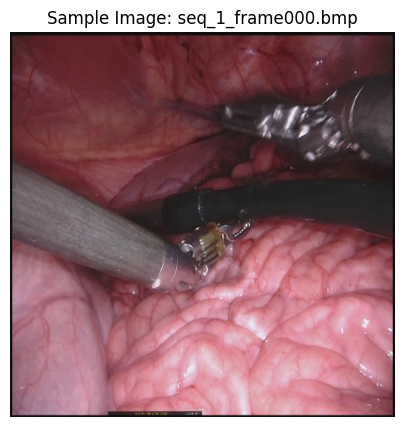

In [ ]:
import os
from matplotlib import pyplot as plt
import cv2

# Root path of the dataset
dataset_root = "/content/endovis2017/endovis2017"

# Train images folder
train_images_dir = os.path.join(dataset_root, "train", "image")

# List all images
img_files = sorted(os.listdir(train_images_dir))
print("Number of training images:", len(img_files))

# Show a sample image
sample_img_path = os.path.join(train_images_dir, img_files[0])
img = cv2.imread(sample_img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(8,5))
plt.title(f"Sample Image: {img_files[0]}")
plt.imshow(img)
plt.axis("off")
plt.show()

Preprocessing

In [ ]:
import os
import json
import shutil
from sklearn.model_selection import train_test_split

# Paths
dataset_root = "/content/endovis2017/endovis2017"
train_images_dir = os.path.join(dataset_root, "train", "image")
instrument_json = os.path.join(dataset_root, "instrument_type_mapping.json")

# Output YOLOv8 dataset folders
yolo_root = "/content/endovis_yolo"
for folder in ["images/train", "images/val", "labels/train", "labels/val"]:
    os.makedirs(os.path.join(yolo_root, folder), exist_ok=True)

# Load instrument type mapping
with open(instrument_json, "r") as f:
    instrument_map = json.load(f)  # { "Bipolar": 0, "Hook": 1, ... }

print("Instrument classes:", instrument_map)

# List all images
img_files = sorted(os.listdir(train_images_dir))

# Split 80% train, 20% val
train_imgs, val_imgs = train_test_split(img_files, test_size=0.2, random_state=42)

# Function to create YOLO label file
def create_yolo_label(img_name, label_dir):
    # Since we only have image-level annotation, simulate one box covering center of image
    # YOLOv8 format: class_id x_center y_center width height (normalized 0-1)
    class_id = 0  # temporary, replace with actual instrument mapping if you have box info
    # Here we use full image as dummy box
    label_path = os.path.join(label_dir, img_name.replace(".bmp", ".txt"))
    with open(label_path, "w") as f:
        f.write(f"{class_id} 0.5 0.5 1.0 1.0\n")

# Copy images and create dummy labels
for img_list, split in [(train_imgs, "train"), (val_imgs, "val")]:
    for img_file in img_list:
        # Copy image
        shutil.copy(os.path.join(train_images_dir, img_file),
                    os.path.join(yolo_root, f"images/{split}/", img_file))
        # Create label
        create_yolo_label(img_file, os.path.join(yolo_root, f"labels/{split}/"))

print("YOLOv8 dataset prepared at:", yolo_root)

Instrument classes: {'Bipolar Forceps': 1, 'Prograsp Forceps': 2, 'Large Needle Driver': 3, 'Vessel Sealer': 4, 'Grasping Retractor': 5, 'Monopolar Curved Scissors': 6, 'Other': 7}
YOLOv8 dataset prepared at: /content/endovis_yolo


In [ ]:
classes = list(instrument_map.keys())  # ["Bipolar", "Hook", ...]

yaml_content = f"""
path: {yolo_root}
train: images/train
val: images/val

nc: {len(classes)}
names: {classes}
"""

yaml_file = os.path.join(yolo_root, "data.yaml")
with open(yaml_file, "w") as f:
    f.write(yaml_content)

print("YOLOv8 data.yaml created at:", yaml_file)

YOLOv8 data.yaml created at: /content/endovis_yolo/data.yaml


In [ ]:
!pip install ultralytics

from ultralytics import YOLO

# Use small segmentation/detection model for Colab
model = YOLO("yolov8n.pt")  # detection model

# Train
model.train(data=yaml_file, epochs=5, imgsz=320)

Ultralytics 8.3.203 🚀 Python-3.12.11 torch-2.8.0+cu126 CPU (Intel Xeon CPU @ 2.20GHz)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/endovis_yolo/data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=5, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=320, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, p

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7fdaafdd4560>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

Training a different model

In [ ]:
import yaml

yaml_dict = {
    "path": "/content/endovis2017/endovis2017",
    "train": "train/image",
    "val": [
        "val1",
        "val2",
        "val3",
        "val4",
        "val5",
        "val6",
        "val7",
        "val8",
        "val9",
        "val10"
    ],
    "names": {
        0: "Bipolar Forceps",
        1: "Prograsp Forceps",
        2: "Large Needle Driver",
        3: "Vessel Sealer",
        4: "Grasping Retractor",
        5: "Monopolar Curved Scissors",
        6: "Other"
    }
}

with open("/content/endovis_yolo/data.yaml", "w") as f:
    yaml.dump(yaml_dict, f)

print("✅ data.yaml rewritten with all train/val splits.")

✅ data.yaml rewritten with all train/val splits.


In [ ]:
import torch
import torch.nn as nn
import torchvision.models as models

class SpatialAttention(nn.Module):
    """Custom spatial attention module"""
    def __init__(self, in_channels):
        super(SpatialAttention, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, in_channels // 2, kernel_size=1)
        self.conv2 = nn.Conv2d(in_channels // 2, 1, kernel_size=1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        attn = self.conv1(x)
        attn = nn.ReLU()(attn)
        attn = self.conv2(attn)
        attn = self.sigmoid(attn)          # [B,1,H,W]
        return x * attn                     # apply attention

class MobileNetV2CustomAttention(nn.Module):
    def __init__(self, num_classes=7, hidden_dim=128, nheads=4, num_layers=2):
        super(MobileNetV2CustomAttention, self).__init__()

        # Backbone
        mobilenet = models.mobilenet_v2(pretrained=True)
        self.feature_extractor = mobilenet.features

        # Spatial Attention
        self.attn = SpatialAttention(1280)

        # Project features to hidden_dim
        self.conv_proj = nn.Conv2d(1280, hidden_dim, kernel_size=1)

        # Transformer Encoder
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=hidden_dim,
            nhead=nheads,
            dim_feedforward=hidden_dim*4,
            dropout=0.1,
            batch_first=True
        )
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)

        # Classifier
        self.classifier = nn.Linear(hidden_dim, num_classes)

    def forward(self, x):
        feat = self.feature_extractor(x)      # [B,1280,H,W]
        feat = self.attn(feat)                # Apply spatial attention
        feat = self.conv_proj(feat)           # [B,hidden_dim,H,W]

        B, C, H, W = feat.shape
        feat = feat.flatten(2).permute(0,2,1) # [B,HW,C]
        feat = self.transformer(feat)
        feat = feat.mean(dim=1)               # global average pooling
        return self.classifier(feat)

In [ ]:
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = MobileNetV2CustomAttention(num_classes=7).to(device)

# Dummy input
x = torch.randn(1, 3, 224, 224).to(device)

# Forward pass
with torch.no_grad():
    out = model(x)

print("Output shape:", out.shape)

In [ ]:
!pip install torchinfo

from torchinfo import summary

summary(model, input_size=(1, 3, 224, 224), device=device)

Layer (type:depth-idx)                             Output Shape              Param #
MobileNetV2CustomAttention                         [1, 7]                    --
├─Sequential: 1-1                                  [1, 1280, 7, 7]           --
│    └─Conv2dNormActivation: 2-1                   [1, 32, 112, 112]         --
│    │    └─Conv2d: 3-1                            [1, 32, 112, 112]         864
│    │    └─BatchNorm2d: 3-2                       [1, 32, 112, 112]         64
│    │    └─ReLU6: 3-3                             [1, 32, 112, 112]         --
│    └─InvertedResidual: 2-2                       [1, 16, 112, 112]         --
│    │    └─Sequential: 3-4                        [1, 16, 112, 112]         896
│    └─InvertedResidual: 2-3                       [1, 24, 56, 56]           --
│    │    └─Sequential: 3-5                        [1, 24, 56, 56]           5,136
│    └─InvertedResidual: 2-4                       [1, 24, 56, 56]           --
│    │    └─Sequential: 3-6   

In [ ]:
import os
from torch.utils.data import Dataset
from PIL import Image
import json

# Load instrument-to-class mapping
with open("/content/endovis2017/endovis2017/instrument_type_mapping.json") as f:
    instr_map = json.load(f)

class EndoVisDataset(Dataset):
    def __init__(self, img_dir, transform=None):
        self.img_dir = img_dir
        self.transform = transform
        self.img_files = sorted(os.listdir(img_dir))

    def __len__(self):
        return len(self.img_files)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.img_files[idx])
        img = Image.open(img_path).convert("RGB")

        # Get label from mapping file
        img_name = self.img_files[idx]
        label = instr_map.get(img_name.split('.')[0], 0)  # default 0 if not found

        if self.transform:
            img = self.transform(img)

        return img, label

train_dataset = EndoVisDataset("/content/endovis2017/endovis2017/train/image", transform=None)

In [ ]:
import os
import json
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
from tqdm import tqdm

class EndoVisDataset(Dataset):
    def __init__(self, img_dir, mapping_json, transform=None):
        self.img_dir = img_dir
        self.transform = transform
        self.img_files = sorted(os.listdir(img_dir))

        with open(mapping_json) as f:
            self.img_map = json.load(f)  # mapping: "seq_1_frame000": class_idx

    def __len__(self):
        return len(self.img_files)

    def __getitem__(self, idx):
        img_name = self.img_files[idx]
        img_path = os.path.join(self.img_dir, img_name)
        img = Image.open(img_path).convert("RGB")

        # Get class label
        key = os.path.splitext(img_name)[0]
        label = self.img_map.get(key, 0)  # default 0 if not found

        if self.transform:
            img = self.transform(img)

        return img, label

# -------------------------
# Transforms
# -------------------------
transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])

train_dataset = EndoVisDataset(
    img_dir="/content/endovis2017/endovis2017/train/image",
    mapping_json="/content/endovis2017/endovis2017/instrument_type_mapping.json",
    transform=transform
)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=2)

# -------------------------
# Model (Your MobileNetV2 + Attention)
# -------------------------
class SpatialAttention(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels, in_channels//2, 1)
        self.conv2 = nn.Conv2d(in_channels//2, 1, 1)
        self.sigmoid = nn.Sigmoid()
    def forward(self, x):
        attn = self.conv1(x)
        attn = nn.ReLU()(attn)
        attn = self.conv2(attn)
        attn = self.sigmoid(attn)
        return x * attn

class MobileNetV2CustomAttention(nn.Module):
    def __init__(self, num_classes=7, hidden_dim=128, nheads=4, num_layers=2):
        super().__init__()
        mobilenet = torch.hub.load('pytorch/vision:v0.14.0', 'mobilenet_v2', pretrained=True)
        self.feature_extractor = mobilenet.features
        self.attn = SpatialAttention(1280)
        self.conv_proj = nn.Conv2d(1280, hidden_dim, 1)
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=hidden_dim,
            nhead=nheads,
            dim_feedforward=hidden_dim*4,
            dropout=0.1,
            batch_first=True
        )
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)
        self.classifier = nn.Linear(hidden_dim, num_classes)

    def forward(self, x):
        feat = self.feature_extractor(x)
        feat = self.attn(feat)
        feat = self.conv_proj(feat)
        B, C, H, W = feat.shape
        feat = feat.flatten(2).permute(0,2,1)  # [B, HW, C]
        feat = self.transformer(feat)
        feat = feat.mean(dim=1)
        return self.classifier(feat)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = MobileNetV2CustomAttention(num_classes=7).to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

epochs = 5  # change as needed
for epoch in range(epochs):
    model.train()
    running_loss = 0.0
    for imgs, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}"):
        imgs, labels = imgs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(imgs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * imgs.size(0)
    epoch_loss = running_loss / len(train_loader.dataset)
    print(f"Epoch [{epoch+1}/{epochs}] Loss: {epoch_loss:.4f}")

# Save trained model
torch.save(model.state_dict(), "/content/mobilenetv2_attention_endovis.pth")
print("Training completed and model saved!")

Downloading: "https://github.com/pytorch/vision/zipball/v0.14.0" to /root/.cache/torch/hub/v0.14.0.zip


Epoch 1/5: 100%|██████████| 113/113 [05:09<00:00,  2.74s/it]


Epoch [1/5] Loss: 0.0606


Epoch 2/5: 100%|██████████| 113/113 [05:06<00:00,  2.72s/it]


Epoch [2/5] Loss: 0.0060


Epoch 3/5: 100%|██████████| 113/113 [05:04<00:00,  2.69s/it]


Epoch [3/5] Loss: 0.0038


Epoch 4/5: 100%|██████████| 113/113 [05:06<00:00,  2.71s/it]


Epoch [4/5] Loss: 0.0027


Epoch 5/5: 100%|██████████| 113/113 [05:02<00:00,  2.68s/it]

Epoch [5/5] Loss: 0.0020
Training completed and model saved!


Tensorflow Model Building

Dataset Building

In [ ]:
import json

with open('/content/endovis2017/endovis2017/instrument_type_mapping.json') as f:
    class_map = json.load(f)

print(class_map)

{'Bipolar Forceps': 1, 'Prograsp Forceps': 2, 'Large Needle Driver': 3, 'Vessel Sealer': 4, 'Grasping Retractor': 5, 'Monopolar Curved Scissors': 6, 'Other': 7}


In [ ]:
class_map = {k: v-1 for k,v in class_map.items()}  # 0 to 6

In [ ]:
import os
import cv2
import numpy as np
from glob import glob

IMG_SIZE = 224
DATA_DIR = "/content/endovis2017/endovis2017/train"

# All images
image_paths = sorted(glob(os.path.join(DATA_DIR, "image/*.bmp")))
# Corresponding labels
label_paths = sorted(glob(os.path.join(DATA_DIR, "label/*.bmp")))

print("Number of images:", len(image_paths))
print("Number of labels:", len(label_paths))

Number of images: 1800
Number of labels: 1800


In [ ]:
images = []
labels = []

for img_path, lbl_path in zip(image_paths, label_paths):
    # Read and preprocess image
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
    img = img / 255.0   # normalize
    images.append(img)

    # Read and preprocess label (mask)
    lbl = cv2.imread(lbl_path, cv2.IMREAD_GRAYSCALE)  # single channel
    lbl = cv2.resize(lbl, (IMG_SIZE, IMG_SIZE))

    # If mask values are actual class indices, convert to int
    labels.append(lbl)

images = np.array(images, dtype=np.float32)
labels = np.array(labels, dtype=np.int32)

print("Images shape:", images.shape)
print("Labels shape:", labels.shape)

Images shape: (1800, 224, 224, 3)
Labels shape: (1800, 224, 224)


In [ ]:
import os
import tensorflow as tf

# -------------------------------
# Parameters
# -------------------------------
IMG_SIZE = 224
NUM_CLASSES = 7
BATCH_SIZE = 8

# Paths
IMAGE_DIR = "/content/endovis2017/endovis2017/train/image"
MASK_DIR  = "/content/endovis2017/endovis2017/train/label"

# -------------------------------
# 1️⃣ Get all file paths
# -------------------------------
image_paths = sorted(tf.io.gfile.glob(os.path.join(IMAGE_DIR, "*.bmp")))
mask_paths  = sorted(tf.io.gfile.glob(os.path.join(MASK_DIR, "*.bmp")))

print(f"Number of images: {len(image_paths)}")
print(f"Number of masks: {len(mask_paths)}")

# -------------------------------
# 2️⃣ Preprocessing functions
# -------------------------------
def preprocess_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_bmp(img, channels=3)
    img = tf.image.resize(img, [IMG_SIZE, IMG_SIZE])
    img = tf.cast(img, tf.float32) / 255.0  # normalize
    return img

def preprocess_mask(mask_path):
    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_bmp(mask, channels=0)  # keep original channels
    mask = tf.expand_dims(mask, axis=-1)         # ensure shape (H, W, 1)
    mask = tf.image.resize(mask, [IMG_SIZE, IMG_SIZE], method='nearest')

    # Ensure mask values are in 0..NUM_CLASSES-1
    mask = tf.cast(mask, tf.int32)
    mask = tf.clip_by_value(mask - 1, 0, NUM_CLASSES - 1)

    # One-hot encode
    mask = tf.one_hot(tf.squeeze(mask, axis=-1), NUM_CLASSES)
    return mask

Number of images: 1800
Number of masks: 1800


In [ ]:
import os
from glob import glob

IMAGE_DIR = "/content/endovis2017/endovis2017/train/image"
MASK_DIR  = "/content/endovis2017/endovis2017/train/label"

image_paths = sorted(glob(os.path.join(IMAGE_DIR, "*.bmp")))
mask_paths  = sorted(glob(os.path.join(MASK_DIR, "*.bmp")))

print("Images:", len(image_paths), "Masks:", len(mask_paths))

Images: 1800 Masks: 1800


In [ ]:
import tensorflow as tf
import cv2
import numpy as np

IMG_SIZE = 224
NUM_CLASSES = 7

def process_image(path):
    # path comes as a tf.Tensor
    path = path.numpy().decode()  # convert from tensor -> string
    img = cv2.imread(path)        # BGR
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
    img = img / 255.0
    return img.astype(np.float32)

def process_mask(path):
    path = path.numpy().decode()  # convert from tensor -> string
    mask = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.resize(mask, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_NEAREST)
    mask = mask - 1
    mask = np.clip(mask, 0, NUM_CLASSES-1)
    mask = tf.keras.utils.to_categorical(mask, NUM_CLASSES)
    return mask.astype(np.float32)

def tf_process_image(path):
    img = tf.py_function(process_image, [path], tf.float32)
    img.set_shape([IMG_SIZE, IMG_SIZE, 3])
    return img

def tf_process_mask(path):
    mask = tf.py_function(process_mask, [path], tf.float32)
    mask.set_shape([IMG_SIZE, IMG_SIZE, NUM_CLASSES])
    return mask

In [ ]:
dataset = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))
dataset = dataset.map(lambda x, y: (tf_process_image(x), tf_process_mask(y)),
                      num_parallel_calls=tf.data.AUTOTUNE)
dataset = dataset.shuffle(500).batch(16).prefetch(tf.data.AUTOTUNE)

In [ ]:
for imgs, masks in dataset.take(1):
    print("Images batch shape:", imgs.shape)   # (batch_size, 224,224,3)
    print("Masks batch shape :", masks.shape)  # (batch_size, 224,224,7)

Images batch shape: (16, 224, 224, 3)
Masks batch shape : (16, 224, 224, 7)


In [ ]:
# Build tf.data.Dataset
def build_dataset(image_paths, mask_paths, batch_size=16, shuffle=True):
    ds = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))
    ds = ds.map(lambda x, y: (tf_process_image(x), tf_process_mask(y)),
                num_parallel_calls=tf.data.AUTOTUNE)
    if shuffle:
        ds = ds.shuffle(500)
    ds = ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return ds

# Split train/validation
from sklearn.model_selection import train_test_split

train_imgs, val_imgs, train_masks, val_masks = train_test_split(
    image_paths, mask_paths, test_size=0.1, random_state=42
)

train_ds = build_dataset(train_imgs, train_masks)
val_ds   = build_dataset(val_imgs, val_masks, shuffle=False)

Model Building

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models

NUM_CLASSES = 7
IMG_SIZE = 224
HIDDEN_DIM = 128
NUM_HEADS = 4
NUM_LAYERS = 2

class SpatialAttention(layers.Layer):
    def __init__(self, **kwargs):
        super(SpatialAttention, self).__init__(**kwargs)
        self.conv1 = layers.Conv2D(HIDDEN_DIM, kernel_size=1, activation='relu')
        self.conv2 = layers.Conv2D(1, kernel_size=1, activation='sigmoid')

    def call(self, x):
        attn = self.conv1(x)
        attn = self.conv2(attn)
        return x * attn

def build_model(input_shape=(IMG_SIZE, IMG_SIZE, 3), num_classes=NUM_CLASSES):
    inputs = layers.Input(shape=input_shape)

    # Encoder: MobileNetV2
    base_model = tf.keras.applications.MobileNetV2(input_shape=input_shape,
                                                   include_top=False,
                                                   weights='imagenet')
    base_model.trainable = False
    x = base_model(inputs)

    # Spatial attention
    x = SpatialAttention()(x)

    # Project features
    x = layers.Conv2D(HIDDEN_DIM, 1, activation='relu')(x)

    # Flatten spatial dims for transformer
    B, H, W, C = x.shape
    x_flat = layers.Reshape((-1, C))(x)  # [B, H*W, C]

    # Transformer encoder
    for _ in range(NUM_LAYERS):
        attn_output = layers.MultiHeadAttention(num_heads=NUM_HEADS, key_dim=C)(x_flat, x_flat)
        x_flat = layers.Add()([x_flat, attn_output])
        x_flat = layers.LayerNormalization()(x_flat)

        ff = layers.Dense(C*4, activation='relu')(x_flat)
        ff = layers.Dense(C)(ff)
        x_flat = layers.Add()([x_flat, ff])
        x_flat = layers.LayerNormalization()(x_flat)

    # Reshape back to spatial
    x = layers.Reshape((H, W, C))(x_flat)

    # Decoder: upsample
    x = layers.Conv2DTranspose(128, 3, strides=2, padding='same', activation='relu')(x)
    x = layers.Conv2DTranspose(64, 3, strides=2, padding='same', activation='relu')(x)
    x = layers.Conv2DTranspose(32, 3, strides=2, padding='same', activation='relu')(x)
    x = layers.Conv2DTranspose(num_classes, 3, strides=1, padding='same', activation='softmax')(x)

    return models.Model(inputs, x)

model = build_model()
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ mobilenetv2_1.00_2… │ (None, 7, 7,      │  2,257,984 │ input_layer_2[0]… │
│ (Functional)        │ 1280)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ spatial_attention_1 │ (None, 7, 7,      │    164,097 │ mobilenetv2_1.00… │
│ (SpatialAttention)  │ 1280)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 7, 7, 128) │    163,968 │ spatial_attentio… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape (Reshape)   │ (None, 49, 128)   │          0 │ conv2d_5[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 49, 128)   │    263,808 │ reshape[0][0],    │
│ (MultiHeadAttentio… │                   │            │ reshape[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 49, 128)   │          0 │ reshape[0][0],    │
│                     │                   │            │ multi_head_atten… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalization │ (None, 49, 128)   │        256 │ add[0][0]         │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 49, 512)   │     66,048 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 49, 128)   │     65,664 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_1 (Add)         │ (None, 49, 128)   │          0 │ layer_normalizat… │
│                     │                   │            │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 49, 128)   │        256 │ add_1[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 49, 128)   │    263,808 │ layer_normalizat… │
│ (MultiHeadAttentio… │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_2 (Add)         │ (None, 49, 128)   │          0 │ layer_normalizat… │
│                     │                   │            │ multi_head_atten… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 49, 128)   │        256 │ add_2[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 49, 512)   │     66,048 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 49, 128)   │     65,664 │ dense_2[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_3 (Add)         │ (None, 49, 128)   │          0 │ layer_normalizat… │
│                     │                   │            │ dense_3[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 49, 128)   │        256 │ add_3[0][0]     

 Total params: 3,619,976 (13.81 MB)

 Trainable params: 1,361,992 (5.20 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
# -------------------------
# 4️⃣ Compile for segmentation
# -------------------------
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, Model
import cv2
import numpy as np
import os
from glob import glob

# ======================
# CONFIG
# ======================
IMG_SIZE = 224
NUM_CLASSES = 7
BATCH_SIZE = 16

IMAGE_DIR = "/content/endovis2017/endovis2017/train/image"
MASK_DIR  = "/content/endovis2017/endovis2017/train/label"

# ======================
# DATA LOADING & PREPROCESSING
# ======================
def preprocess_image(path):
    img = cv2.imread(path)                       # BGR
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
    img = img / 255.0
    return img.astype(np.float32)

def preprocess_mask(path):
    mask = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.resize(mask, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_NEAREST)
    mask = mask - 1
    mask = np.clip(mask, 0, NUM_CLASSES-1)
    mask = tf.keras.utils.to_categorical(mask, NUM_CLASSES)
    return mask.astype(np.float32)

# Collect file paths
image_paths = sorted(glob(os.path.join(IMAGE_DIR, "*.bmp")))
mask_paths  = sorted(glob(os.path.join(MASK_DIR, "*.bmp")))

# Build tf.data.Dataset
def load_dataset(image_paths, mask_paths):
    def _load_image_mask(img_path, mask_path):
        img = tf.py_function(preprocess_image, [img_path], tf.float32)
        img.set_shape([IMG_SIZE, IMG_SIZE, 3])
        mask = tf.py_function(preprocess_mask, [mask_path], tf.float32)
        mask.set_shape([IMG_SIZE, IMG_SIZE, NUM_CLASSES])
        return img, mask

    ds = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))
    ds = ds.map(_load_image_mask, num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.shuffle(500).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
    return ds

train_ds = load_dataset(image_paths, mask_paths)

# ======================
# CUSTOM SPATIAL ATTENTION
# ======================
class SpatialAttention(layers.Layer):
    def __init__(self, channels):
        super().__init__()
        self.conv1 = layers.Conv2D(channels//2, 1, activation='relu')
        self.conv2 = layers.Conv2D(1, 1, activation='sigmoid')

    def call(self, x):
        attn = self.conv1(x)
        attn = self.conv2(attn)
        return x * attn

# ======================
# MODEL DEFINITION
# ======================
def build_model(img_size=IMG_SIZE, num_classes=NUM_CLASSES, hidden_dim=128, nheads=4, num_layers=2):
    # Input
    inputs = layers.Input(shape=(img_size, img_size, 3))

    # Backbone
    backbone = tf.keras.applications.MobileNetV2(input_shape=(img_size,img_size,3),
                                                 include_top=False, weights='imagenet')
    x = backbone(inputs)

    # Spatial Attention
    x = SpatialAttention(x.shape[-1])(x)

    # Project to hidden_dim
    x = layers.Conv2D(hidden_dim, 1)(x)

    # Flatten spatial dims for transformer
    b, h, w, c = x.shape
    x = layers.Reshape((h*w, c))(x)

    # Transformer Encoder
    for _ in range(num_layers):
        attn_out = layers.MultiHeadAttention(num_heads=nheads, key_dim=hidden_dim)(x, x)
        x = layers.Add()([x, attn_out])
        x = layers.LayerNormalization()(x)

        ffn = layers.Dense(hidden_dim*4, activation='relu')(x)
        ffn = layers.Dense(hidden_dim)(ffn)
        x = layers.Add()([x, ffn])
        x = layers.LayerNormalization()(x)

    # Reshape back to spatial
    x = layers.Reshape((h, w, hidden_dim))(x)

    # Decoder: upsample to original size
    x = layers.Conv2D(num_classes, 1)(x)
    x = layers.UpSampling2D(size=(img_size//h, img_size//w), interpolation='bilinear')(x)

    outputs = layers.Activation('softmax')(x)

    model = Model(inputs, outputs)
    return model

model = build_model()
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ mobilenetv2_1.00_2… │ (None, 7, 7,      │  2,257,984 │ input_layer[0][0] │
│ (Functional)        │ 1280)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ spatial_attention   │ (None, 7, 7,      │    820,481 │ mobilenetv2_1.00… │
│ (SpatialAttention)  │ 1280)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 7, 7, 128) │    163,968 │ spatial_attentio… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape (Reshape)   │ (None, 49, 128)   │          0 │ conv2d_2[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 49, 128)   │    263,808 │ reshape[0][0],    │
│ (MultiHeadAttentio… │                   │            │ reshape[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 49, 128)   │          0 │ reshape[0][0],    │
│                     │                   │            │ multi_head_atten… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalization │ (None, 49, 128)   │        256 │ add[0][0]         │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 49, 512)   │     66,048 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 49, 128)   │     65,664 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_1 (Add)         │ (None, 49, 128)   │          0 │ layer_normalizat… │
│                     │                   │            │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 49, 128)   │        256 │ add_1[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 49, 128)   │    263,808 │ layer_normalizat… │
│ (MultiHeadAttentio… │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_2 (Add)         │ (None, 49, 128)   │          0 │ layer_normalizat… │
│                     │                   │            │ multi_head_atten… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 49, 128)   │        256 │ add_2[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 49, 512)   │     66,048 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 49, 128)   │     65,664 │ dense_2[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_3 (Add)         │ (None, 49, 128)   │          0 │ layer_normalizat… │
│                     │                   │            │ dense_3[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 49, 128)   │        256 │ add_3[0][0]     

 Total params: 4,035,400 (15.39 MB)

 Trainable params: 4,001,288 (15.26 MB)

 Non-trainable params: 34,112 (133.25 KB)

In [ ]:
def preprocess_image(path):
    # Convert Tensor -> Python string
    path = path.numpy().decode('utf-8')  # <-- decode!
    img = cv2.imread(path)
    if img is None:
        raise ValueError(f"Could not read image: {path}")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
    img = img / 255.0
    return img.astype(np.float32)

def preprocess_mask(path):
    path = path.numpy().decode('utf-8')
    mask = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    if mask is None:
        raise ValueError(f"Could not read mask: {path}")
    mask = cv2.resize(mask, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_NEAREST)
    mask = mask - 1
    mask = np.clip(mask, 0, NUM_CLASSES-1)
    mask = tf.keras.utils.to_categorical(mask, NUM_CLASSES)
    return mask.astype(np.float32)

# Wrap for tf.data
def tf_process_image(path):
    img = tf.py_function(preprocess_image, [path], tf.float32)
    img.set_shape([IMG_SIZE, IMG_SIZE, 3])
    return img

def tf_process_mask(path):
    mask = tf.py_function(preprocess_mask, [path], tf.float32)
    mask.set_shape([IMG_SIZE, IMG_SIZE, NUM_CLASSES])
    return mask

In [ ]:
train_ds = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))
train_ds = train_ds.map(lambda x, y: (tf_process_image(x), tf_process_mask(y)),
                        num_parallel_calls=tf.data.AUTOTUNE)
train_ds = train_ds.shuffle(500).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

for imgs, masks in train_ds.take(1):
    print(imgs.shape, masks.shape)

(16, 224, 224, 3) (16, 224, 224, 7)


In [ ]:
masks[0][0][0]

<tf.Tensor: shape=(7,), dtype=float32, numpy=array([0., 0., 0., 0., 0., 0., 1.], dtype=float32)>

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import MobileNetV2

# -----------------------------
# Hyperparameters
# -----------------------------
IMG_SIZE = 224
NUM_CLASSES = 7
HIDDEN_DIM = 128
NHEADS = 4
NUM_TRANSFORMER_LAYERS = 2
BATCH_SIZE = 16
EPOCHS = 5

# -----------------------------
# Custom spatial attention layer
# -----------------------------
class SpatialAttention(layers.Layer):
    def __init__(self, channels):
        super(SpatialAttention, self).__init__()
        self.conv1 = layers.Conv2D(channels // 2, kernel_size=1, activation='relu')
        self.conv2 = layers.Conv2D(1, kernel_size=1, activation='sigmoid')

    def call(self, x):
        attn = self.conv1(x)
        attn = self.conv2(attn)  # [B,H,W,1]
        return x * attn

# -----------------------------
# Build model
# -----------------------------
def build_model(img_size=IMG_SIZE, num_classes=NUM_CLASSES):
    inputs = layers.Input(shape=(img_size, img_size, 3))

    # Backbone
    backbone = MobileNetV2(include_top=False, weights='imagenet', input_tensor=inputs)
    feat = backbone.output  # shape: (B, 7, 7, 1280)

    # Spatial Attention
    feat = SpatialAttention(feat.shape[-1])(feat)  # same shape

    # Project channels
    feat = layers.Conv2D(HIDDEN_DIM, kernel_size=1, activation='relu')(feat)  # (B,7,7,HIDDEN_DIM)

    # Flatten spatial dims for transformer
    B, H, W, C = feat.shape
    x = layers.Reshape((H*W, C))(feat)

    # Transformer encoder layers
    for _ in range(NUM_TRANSFORMER_LAYERS):
        attn_output = layers.MultiHeadAttention(num_heads=NHEADS, key_dim=C)(x, x)
        x = layers.LayerNormalization(epsilon=1e-6)(x + attn_output)
        ffn = layers.Dense(C*4, activation='relu')(x)
        ffn = layers.Dense(C)(ffn)
        x = layers.LayerNormalization(epsilon=1e-6)(x + ffn)

    # Reshape back to spatial
    x = layers.Reshape((H, W, C))(x)

    # Upsample to original image size
    x = layers.Conv2DTranspose(128, 3, strides=2, padding='same', activation='relu')(x)  # 14x14
    x = layers.Conv2DTranspose(64, 3, strides=2, padding='same', activation='relu')(x)   # 28x28
    x = layers.Conv2DTranspose(32, 3, strides=2, padding='same', activation='relu')(x)   # 56x56
    x = layers.Conv2DTranspose(16, 3, strides=2, padding='same', activation='relu')(x)   # 112x112
    x = layers.Conv2DTranspose(num_classes, 3, strides=2, padding='same', activation='softmax')(x)  # 224x224

    model = models.Model(inputs, x)
    return model

# -----------------------------
# Instantiate
# -----------------------------
model = build_model()
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()


/tmp/ipython-input-1519142987.py:37: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  backbone = MobileNetV2(include_top=False, weights='imagenet', input_tensor=inputs)


Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_18      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer_18[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 4,279,976 (16.33 MB)

 Trainable params: 4,245,864 (16.20 MB)

 Non-trainable params: 34,112 (133.25 KB)

In [ ]:
import tensorflow as tf

# -----------------------------
# Split train/validation
# -----------------------------
VAL_SPLIT = 0.1
dataset_size = len(image_paths)
val_size = int(dataset_size * VAL_SPLIT)

# Shuffle first
dataset = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))
dataset = dataset.shuffle(buffer_size=dataset_size, reshuffle_each_iteration=True)

# Split
val_ds = dataset.take(val_size)
train_ds = dataset.skip(val_size)

# -----------------------------
# Map preprocessing
# -----------------------------
train_ds = train_ds.map(lambda x, y: (tf_process_image(x), tf_process_mask(y)),
                        num_parallel_calls=tf.data.AUTOTUNE)
train_ds = train_ds.shuffle(500).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

val_ds = val_ds.map(lambda x, y: (tf_process_image(x), tf_process_mask(y)),
                    num_parallel_calls=tf.data.AUTOTUNE)
val_ds = val_ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

# -----------------------------
# Check shapes
# -----------------------------
for imgs, masks in train_ds.take(1):
    print("Train batch:", imgs.shape, masks.shape)
for imgs, masks in val_ds.take(1):
    print("Val batch:", imgs.shape, masks.shape)

Train batch: (16, 224, 224, 3) (16, 224, 224, 7)
Val batch: (16, 224, 224, 3) (16, 224, 224, 7)


In [ ]:
# -----------------------------
# Train the model
# -----------------------------
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=5
)

Epoch 1/5
102/102 ━━━━━━━━━━━━━━━━━━━━ 474s 4s/step - accuracy: 0.6635 - loss: 1.0905 - val_accuracy: 0.8723 - val_loss: 0.9591
Epoch 2/5
102/102 ━━━━━━━━━━━━━━━━━━━━ 425s 4s/step - accuracy: 0.8710 - loss: 0.3470 - val_accuracy: 0.8655 - val_loss: 1.1790
Epoch 3/5
102/102 ━━━━━━━━━━━━━━━━━━━━ 418s 4s/step - accuracy: 0.8801 - loss: 0.3089 - val_accuracy: 0.8720 - val_loss: 0.9611
Epoch 4/5
102/102 ━━━━━━━━━━━━━━━━━━━━ 419s 4s/step - accuracy: 0.9082 - loss: 0.2494 - val_accuracy: 0.8660 - val_loss: 1.9461
Epoch 5/5
102/102 ━━━━━━━━━━━━━━━━━━━━ 420s 4s/step - accuracy: 0.9177 - loss: 0.2267 - val_accuracy: 0.8576 - val_loss: 1.9338


1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


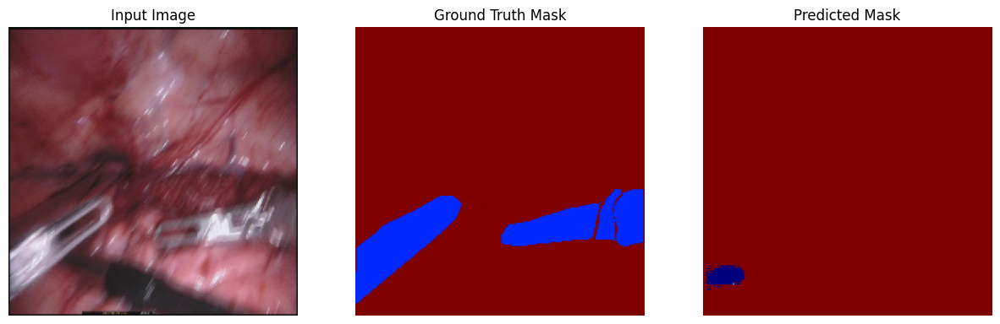

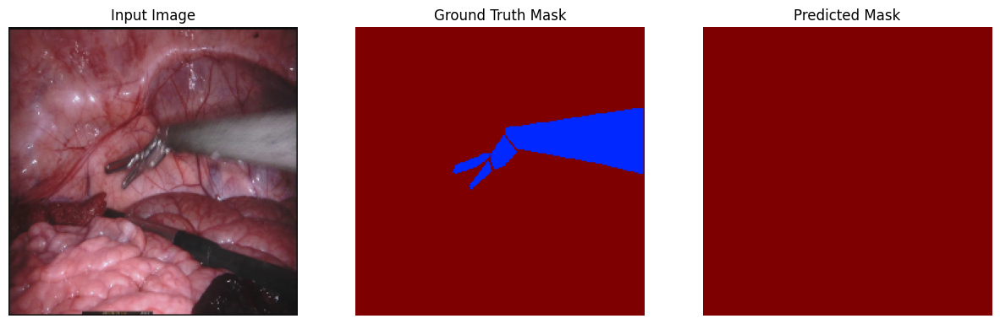

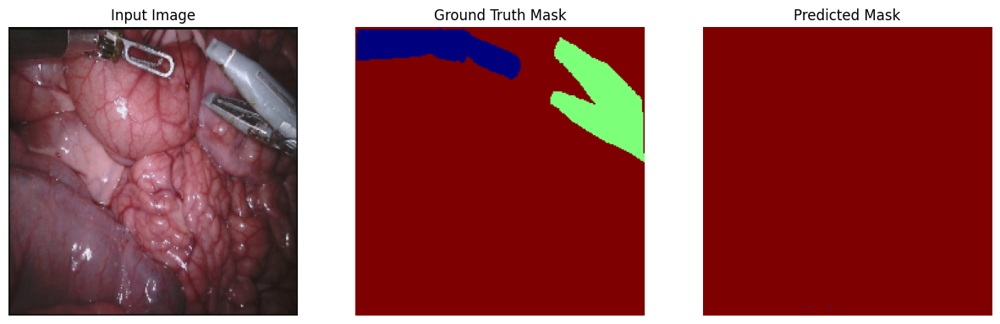

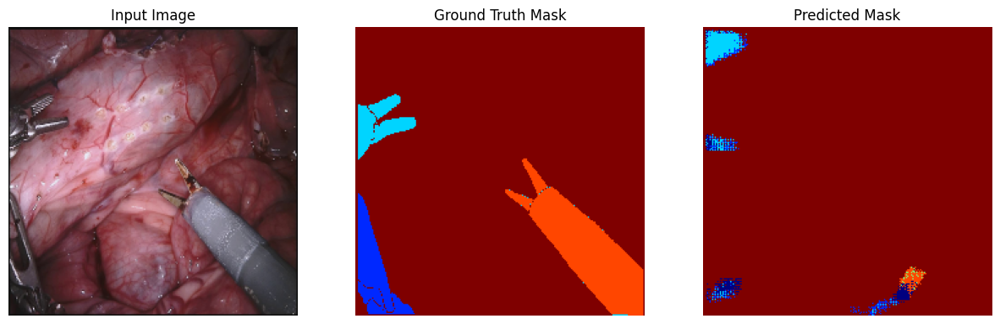

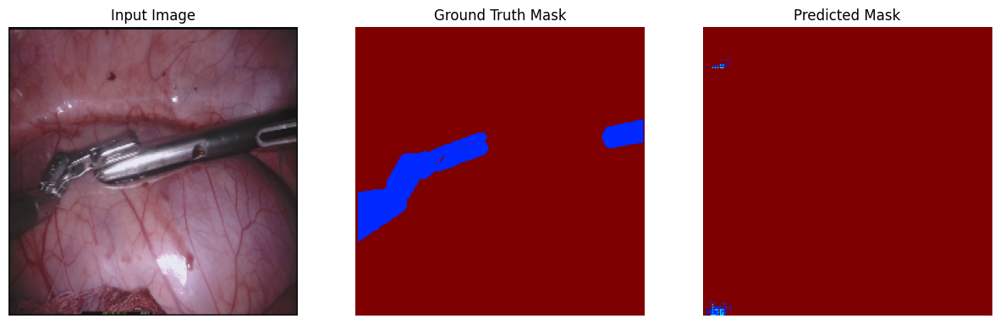

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def visualize_predictions(model, dataset, num_samples=5):
    """
    Visualize input images, ground truth masks, and predicted masks.
    """
    for imgs, masks in dataset.take(1):
        preds = model.predict(imgs)
        for i in range(num_samples):
            fig, axs = plt.subplots(1, 3, figsize=(15,5))

            # Input image
            axs[0].imshow(imgs[i])
            axs[0].set_title("Input Image")

            # Ground truth mask
            axs[1].imshow(np.argmax(masks[i], axis=-1), cmap='jet', vmin=0, vmax=NUM_CLASSES-1)
            axs[1].set_title("Ground Truth Mask")

            # Predicted mask
            axs[2].imshow(np.argmax(preds[i], axis=-1), cmap='jet', vmin=0, vmax=NUM_CLASSES-1)
            axs[2].set_title("Predicted Mask")

            for ax in axs:
                ax.axis('off')

            plt.show()

visualize_predictions(model, val_ds, num_samples=5)

Deeper Analysis

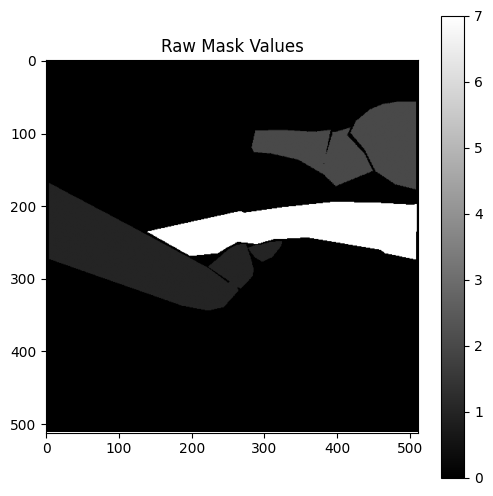

Unique pixel values in this mask: [0 1 2 7]


In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Example mask path
img_path = "/content/endovis2017/endovis2017/train/image/seq_1_frame000.bmp"
mask_path = "/content/endovis2017/endovis2017/train/label/seq_1_frame000.bmp"

# Load the mask
img = cv2.imread(img_path,cv2.COLOR_BGR2RGB)
mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # HxW, values = 0..7?

# Show the raw mask
plt.figure(figsize=(6,6))
plt.imshow(mask, cmap='gray')
plt.colorbar()
plt.title("Raw Mask Values")
plt.show()

# Inspect unique values
unique_values = np.unique(mask)
print("Unique pixel values in this mask:", unique_values)

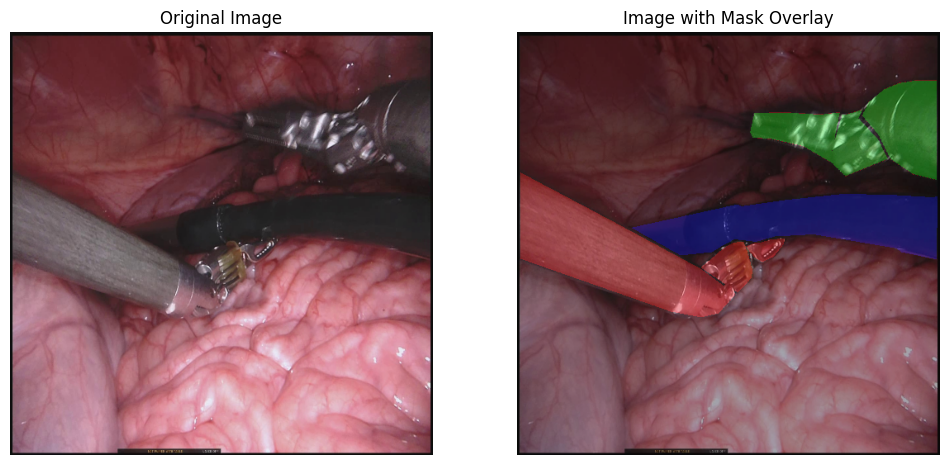

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load image and mask
img_path = "/content/endovis2017/endovis2017/train/image/seq_1_frame000.bmp"
mask_path = "/content/endovis2017/endovis2017/train/label/seq_1_frame000.bmp"

img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

# Create a color map for mask values
color_map = {
    0: (0, 0, 0),          # background - black
    1: (255, 0, 0),        # Bipolar Forceps - red
    2: (0, 255, 0),        # Prograsp Forceps - green
    7: (0, 0, 255)         # Other - blue
}

# Create colored mask
colored_mask = np.zeros_like(img)
for k, v in color_map.items():
    colored_mask[mask == k] = v

# Overlay mask on image (50% transparency)
overlay = cv2.addWeighted(img, 0.7, colored_mask, 0.3, 0)

# Plot
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.imshow(img)
plt.title("Original Image")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(overlay)
plt.title("Image with Mask Overlay")
plt.axis('off')
plt.show()

Run from here for Tool Detection

In [ ]:
import os
import cv2
import numpy as np
from glob import glob

NUM_CLASSES = 7
IMAGE_DIR = "/content/endovis2017/endovis2017/train/image"
MASK_DIR  = "/content/endovis2017/endovis2017/train/label"

image_paths = sorted(glob(os.path.join(IMAGE_DIR, "*.bmp")))
mask_paths  = sorted(glob(os.path.join(MASK_DIR, "*.bmp")))

def mask_to_vector(mask_path):
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    unique = np.unique(mask)
    vec = np.zeros(NUM_CLASSES, dtype=np.float32)
    for u in unique:
        if u < NUM_CLASSES:   # ignore unexpected values
            vec[u] = 1.0
    return vec

Y = np.array([mask_to_vector(p) for p in mask_paths])

In [ ]:
IMG_SIZE = 224

def preprocess_image(path):
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
    img = img / 255.0
    return img.astype(np.float32)

X = np.array([preprocess_image(p) for p in image_paths])

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_val, Y_train, Y_val = train_test_split(X, Y, test_size=0.2, random_state=42)

In [ ]:
from sklearn.model_selection import train_test_split

# Split 80/20 for train/validation
X_train, X_val, Y_train, Y_val = train_test_split(X, Y, test_size=0.2, random_state=42)

print("Training set:", X_train.shape, Y_train.shape)
print("Validation set:", X_val.shape, Y_val.shape)

Training set: (1440, 224, 224, 3) (1440, 7)
Validation set: (360, 224, 224, 3) (360, 7)


In [ ]:
import tensorflow as tf

BATCH_SIZE = 16

train_ds = tf.data.Dataset.from_tensor_slices((X_train, Y_train))
train_ds = train_ds.shuffle(500).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

val_ds = tf.data.Dataset.from_tensor_slices((X_val, Y_val))
val_ds = val_ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

Model Building

In [ ]:
from tensorflow.keras import layers, models
from tensorflow.keras.applications import MobileNetV2

IMG_SIZE = 224
NUM_CLASSES = 7
HIDDEN_DIM = 128
NUM_HEADS = 4
NUM_LAYERS = 2

inputs = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
x = MobileNetV2(include_top=False, weights='imagenet')(inputs)

# Spatial attention
attn = layers.Conv2D(64, 1, activation='relu')(x)
attn = layers.Conv2D(1, 1, activation='sigmoid')(attn)
x = layers.Multiply()([x, attn])

# Project features
x = layers.Conv2D(HIDDEN_DIM, 1)(x)
B, H, W, C = x.shape[0], x.shape[1], x.shape[2], x.shape[3]
x = layers.Reshape((H*W, C))(x)

# Transformer encoder
for _ in range(NUM_LAYERS):
    attn_out = layers.MultiHeadAttention(num_heads=NUM_HEADS, key_dim=HIDDEN_DIM)(x, x)
    x = layers.Add()([x, attn_out])
    x = layers.LayerNormalization()(x)
    ff = layers.Dense(HIDDEN_DIM*4, activation='relu')(x)
    ff = layers.Dense(HIDDEN_DIM)(ff)
    x = layers.Add()([x, ff])
    x = layers.LayerNormalization()(x)

x = layers.GlobalAveragePooling1D()(x)
outputs = layers.Dense(NUM_CLASSES, activation='sigmoid')(x)

model = models.Model(inputs, outputs)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

/tmp/ipython-input-461386253.py:11: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  x = MobileNetV2(include_top=False, weights='imagenet')(inputs)


Model: "functional_13"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_23      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ mobilenetv2_1.00_2… │ (None, 7, 7,      │  2,257,984 │ input_layer_23[0… │
│ (Functional)        │ 1280)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_37 (Conv2D)  │ (None, 7, 7, 64)  │     81,984 │ mobilenetv2_1.00… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_38 (Conv2D)  │ (None, 7, 7, 1)   │         65 │ conv2d_37[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multiply_3          │ (None, 7, 7,      │          0 │ mobilenetv2_1.00… │
│ (Multiply)          │ 1280)             │            │ conv2d_38[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_39 (Conv2D)  │ (None, 7, 7, 128) │    163,968 │ multiply_3[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_11          │ (None, 49, 128)   │          0 │ conv2d_39[0][0]   │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 49, 128)   │    263,808 │ reshape_11[0][0], │
│ (MultiHeadAttentio… │                   │            │ reshape_11[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_12 (Add)        │ (None, 49, 128)   │          0 │ reshape_11[0][0], │
│                     │                   │            │ multi_head_atten… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 49, 128)   │        256 │ add_12[0][0]      │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_20 (Dense)    │ (None, 49, 512)   │     66,048 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_21 (Dense)    │ (None, 49, 128)   │     65,664 │ dense_20[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_13 (Add)        │ (None, 49, 128)   │          0 │ layer_normalizat… │
│                     │                   │            │ dense_21[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 49, 128)   │        256 │ add_13[0][0]      │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 49, 128)   │    263,808 │ layer_normalizat… │
│ (MultiHeadAttentio… │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_14 (Add)        │ (None, 49, 128)   │          0 │ layer_normalizat… │
│                     │                   │            │ multi_head_atten… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 49, 128)   │        256 │ add_14[0][0]      │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_22 (Dense)    │ (None, 49, 512)   │     66,048 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_23 (Dense)    │ (None, 49, 128)   │     65,664 │ dense_22[0][0]  

 Total params: 3,296,968 (12.58 MB)

 Trainable params: 3,262,856 (12.45 MB)

 Non-trainable params: 34,112 (133.25 KB)

In [ ]:
EPOCHS = 5

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS
)

Epoch 1/5
90/90 ━━━━━━━━━━━━━━━━━━━━ 357s 4s/step - accuracy: 0.8724 - loss: 0.2817 - val_accuracy: 1.0000 - val_loss: 0.7407
Epoch 2/5
90/90 ━━━━━━━━━━━━━━━━━━━━ 319s 4s/step - accuracy: 0.8758 - loss: 0.1155 - val_accuracy: 0.2556 - val_loss: 1.5659
Epoch 3/5
90/90 ━━━━━━━━━━━━━━━━━━━━ 312s 3s/step - accuracy: 0.8684 - loss: 0.0856 - val_accuracy: 0.8111 - val_loss: 0.8587
Epoch 4/5
90/90 ━━━━━━━━━━━━━━━━━━━━ 327s 4s/step - accuracy: 0.7637 - loss: 0.0888 - val_accuracy: 0.3194 - val_loss: 1.2166
Epoch 5/5
90/90 ━━━━━━━━━━━━━━━━━━━━ 313s 3s/step - accuracy: 0.7379 - loss: 0.0488 - val_accuracy: 0.5278 - val_loss: 1.0782


In [ ]:
set(Y_train[0])

{np.float32(0.0), np.float32(1.0)}

In [ ]:
val_loss, val_acc = model.evaluate(val_ds)
print(f"Validation loss: {val_loss:.4f}, Validation accuracy: {val_acc:.4f}")

23/23 ━━━━━━━━━━━━━━━━━━━━ 14s 628ms/step - accuracy: 0.4625 - loss: 1.1114
Validation loss: 1.0782, Validation accuracy: 0.5278


In [ ]:
for imgs, masks in val_ds.take(1):
    preds = model.predict(imgs)
    print("Predicted masks shape:", preds.shape)
    break

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Predicted masks shape: (16, 7)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 648ms/step


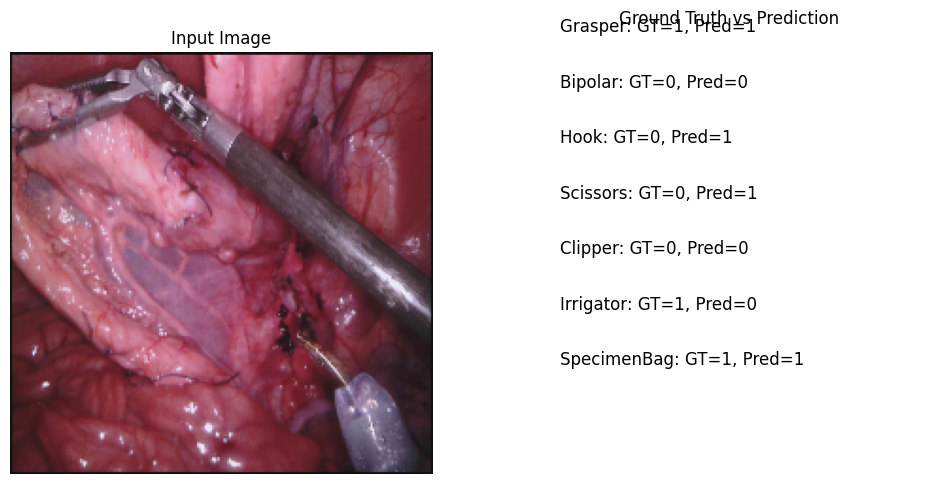

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

CLASS_NAMES = ["Grasper", "Bipolar", "Hook", "Scissors", "Clipper", "Irrigator", "SpecimenBag"]

def show_prediction(img, true_labels, pred_probs, threshold=0.5):
    if hasattr(img, "numpy"):
        img = img.numpy()

    # Convert grayscale to RGB if needed
    if img.shape[-1] == 1:
        img = np.repeat(img, 3, axis=-1)

    # Convert predictions to binary presence
    pred_labels = (pred_probs > threshold).astype(int)

    # Plot input image
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(img.astype(np.float32))
    plt.title("Input Image")
    plt.axis("off")

    # Show ground truth vs prediction
    plt.subplot(1, 2, 2)
    plt.title("Ground Truth vs Prediction")
    for i, cls in enumerate(CLASS_NAMES):
        gt = int(true_labels[i])
        pred = int(pred_labels[i])
        plt.text(0.1, 1 - i * 0.12, f"{cls}: GT={gt}, Pred={pred}", fontsize=12)

    plt.axis("off")
    plt.show()


# Example usage
for imgs, masks in val_ds.take(1):
    preds = model.predict(imgs)
    show_prediction(imgs[0], masks[0], preds[0])
    break

Further Analysis

In [ ]:
import numpy as np

all_labels = []
for _, labels in train_ds.unbatch():
    all_labels.append(labels.numpy())
all_labels = np.array(all_labels)

tool_freq = all_labels.sum(axis=0)
print("Tool counts:", tool_freq)

Tool counts: [1440.  529.  593.  537.  312.  182.  286.]


In [ ]:
import numpy as np
from collections import Counter

# X, Y = your images and multi-label vectors
NUM_CLASSES = Y.shape[1]

# Count per tool
tool_counts = Y.sum(axis=0)
max_count = int(tool_counts.max())

X_resampled, Y_resampled = [], []

for c in range(NUM_CLASSES):
    idx = np.where(Y[:, c] == 1)[0]
    n_repeat = max_count - len(idx)
    if n_repeat > 0:
        sampled_idx = np.random.choice(idx, size=n_repeat, replace=True)
        X_resampled.append(X[sampled_idx])
        Y_resampled.append(Y[sampled_idx])

# Combine original + resampled
X_final = np.concatenate([X] + X_resampled, axis=0)
Y_final = np.concatenate([Y] + Y_resampled, axis=0)

# Shuffle
perm = np.random.permutation(len(X_final))
X_final, Y_final = X_final[perm], Y_final[perm]

# Check counts
print("Tool counts after corrected resampling:", Y_final.sum(axis=0))

In [ ]:
# ---------- Train/Validation split ----------
X_train, X_val, Y_train, Y_val = train_test_split(X, Y, test_size=0.2, random_state=SEED, shuffle=True)
print("Train/Val sizes:", X_train.shape[0], X_val.shape[0])

# ---------- Class counts & class weights ----------
counts = Y_train.sum(axis=0)  # how many frames contain each tool in training set
total = Y_train.shape[0]
print("Train counts per class:", counts)

# compute class weight per class (inverse frequency)
eps = 1e-6
class_weights = (total / (NUM_CLASSES * (counts + eps))).astype(np.float32)
# normalize so mean is 1 (optional)
class_weights = class_weights / np.mean(class_weights)
print("Class weights:", class_weights)

# Convert to Tensor for use in loss
class_weights_tf = tf.constant(class_weights, dtype=tf.float32)

# ---------- Weighted binary crossentropy loss (per-class weighting) ----------
def weighted_binary_crossentropy(y_true, y_pred):
    """
    y_true, y_pred: shape (batch, num_classes)
    Applies per-class weight to the binary crossentropy per class.
    Returns scalar loss.
    """
    y_pred = tf.clip_by_value(y_pred, 1e-7, 1.0 - 1e-7)
    bce = - (y_true * tf.math.log(y_pred) + (1.0 - y_true) * tf.math.log(1.0 - y_pred))
    # bce shape: (batch, num_classes). Multiply each column by class weight:
    weighted = bce * class_weights_tf  # broadcasting over batch dimension
    return tf.reduce_mean(weighted)

Train/Val sizes: 1440 360
Train counts per class: [1440.  529.  593.  537.  312.  182.  286.]
Class weights: [0.2652073  0.72192526 0.6440109  0.7111703  1.2240336  2.0983431
 1.3353093 ]


In [ ]:
# ---------- Build model (EfficientNetB0 backbone) ----------
def build_classifier(img_size=IMG_SIZE, num_classes=NUM_CLASSES, dropout=0.3):
    backbone = EfficientNetB0(include_top=False, weights='imagenet', input_shape=(img_size, img_size, 3), pooling='avg')
    # you can choose backbone.trainable = True to fine-tune
    backbone.trainable = False  # start with frozen backbone for stability
    inputs = layers.Input(shape=(img_size, img_size, 3))
    x = backbone(inputs, training=False)
    x = layers.Dropout(dropout)(x)
    x = layers.Dense(512, activation='relu')(x)
    x = layers.Dropout(0.25)(x)
    outputs = layers.Dense(num_classes, activation='sigmoid')(x)
    model = models.Model(inputs, outputs)
    return model

model = build_classifier()
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss=weighted_binary_crossentropy,
    metrics=[
        tf.keras.metrics.AUC(name='auc'),
        tf.keras.metrics.Precision(name='precision'),
        tf.keras.metrics.Recall(name='recall')
    ]
)
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 1280)           │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 512)            │       655,872 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 7)              │         3,591 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,709,034 (17.96 MB)

 Trainable params: 659,463 (2.52 MB)

 Non-trainable params: 4,049,571 (15.45 MB)

In [ ]:

# ---------- Build tf.data pipelines ----------
train_ds = tf.data.Dataset.from_tensor_slices((X_train, Y_train))
train_ds = train_ds.shuffle(buffer_size=len(X_train), seed=SEED).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

val_ds = tf.data.Dataset.from_tensor_slices((X_val, Y_val))
val_ds = val_ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

# ---------- Callbacks ----------
callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor='val_auc', patience=3, mode='max', restore_best_weights=True, verbose=1),
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_auc', factor=0.5, patience=2, min_lr=1e-7, verbose=1),
]

# ---------- Train ----------
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    callbacks=callbacks,
    verbose=2
)

Epoch 1/10
90/90 - 130s - 1s/step - auc: 0.7578 - loss: 0.5283 - precision: 0.8033 - recall: 0.4063 - val_auc: 0.7833 - val_loss: 0.4980 - val_precision: 1.0000 - val_recall: 0.3758 - learning_rate: 1.0000e-04
Epoch 2/10
90/90 - 109s - 1s/step - auc: 0.7689 - loss: 0.5068 - precision: 0.9335 - recall: 0.3911 - val_auc: 0.7783 - val_loss: 0.4914 - val_precision: 1.0000 - val_recall: 0.3758 - learning_rate: 1.0000e-04
Epoch 3/10
90/90 - 111s - 1s/step - auc: 0.7707 - loss: 0.5049 - precision: 0.9169 - recall: 0.3952 - val_auc: 0.7717 - val_loss: 0.4927 - val_precision: 1.0000 - val_recall: 0.3758 - learning_rate: 1.0000e-04
Epoch 4/10
90/90 - 140s - 2s/step - auc: 0.7685 - loss: 0.5038 - precision: 0.9304 - recall: 0.3859 - val_auc: 0.7815 - val_loss: 0.4914 - val_precision: 1.0000 - val_recall: 0.3758 - learning_rate: 1.0000e-04
Epoch 4: early stopping
Restoring model weights from the end of the best epoch: 1.


In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = (
    train_ds
    .shuffle(1024)
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)

val_ds = (
    val_ds
    .batch(BATCH_SIZE)
    .prefetch(AUTOTUNE)
)

In [ ]:
from sklearn.preprocessing import MultiLabelBinarizer
mlb = MultiLabelBinarizer(classes=list(range(N_CLASSES)))
y_multi = mlb.fit_transform(Y)  # convert list-of-labels → 0/1 vector

In [ ]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss="binary_crossentropy",
    metrics=[
        tf.keras.metrics.AUC(name='auc'),
        tf.keras.metrics.Precision(name='precision'),
        tf.keras.metrics.Recall(name='recall')
    ]
)

Main Codes Start Here

Different Model

In [ ]:
from tensorflow.keras import layers, models
from tensorflow.keras.applications import MobileNetV2

NUM_CLASSES = 7
IMG_SIZE = 224
HIDDEN_DIM = 128
N_HEADS = 4
NUM_LAYERS = 2

from tensorflow.keras import layers, models
from tensorflow.keras.applications import MobileNetV2

def build_model(input_shape=(224,224,3), num_classes=7):
    inputs = layers.Input(shape=input_shape)

    # 1️⃣ Backbone
    backbone = MobileNetV2(include_top=False, weights='imagenet', input_tensor=inputs)
    x = backbone.output  # shape: (7,7,1280)

    # 2️⃣ Global Pooling
    x = layers.GlobalAveragePooling2D()(x)  # shape: (1280,)

    # 3️⃣ Optional Transformer-like self-attention (simple dense attention here)
    # Expand dims to simulate sequence for MultiHeadAttention
    seq = layers.Reshape((1, x.shape[-1]))(x)
    attn = layers.MultiHeadAttention(num_heads=4, key_dim=128)(seq, seq)
    attn = layers.Flatten()(attn)

    # 4️⃣ Dense layers for multi-label prediction
    x = layers.Concatenate()([x, attn])
    x = layers.Dense(512, activation='relu')(x)
    x = layers.Dropout(0.3)(x)
    outputs = layers.Dense(num_classes, activation='sigmoid')(x)  # sigmoid for multi-label

    model = models.Model(inputs, outputs)
    return model

model = build_model()
model.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy', tf.keras.metrics.AUC(name='auc'), tf.keras.metrics.Precision(), tf.keras.metrics.Recall()]
)

model.summary()

/tmp/ipython-input-3239448288.py:17: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  backbone = MobileNetV2(include_top=False, weights='imagenet', input_tensor=inputs)


Model: "functional_19"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_32      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer_32[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 6,197,063 (23.64 MB)

 Trainable params: 6,162,951 (23.51 MB)

 Non-trainable params: 34,112 (133.25 KB)

In [ ]:
model = build_model()
model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss='binary_crossentropy',  # multi-label classification
    metrics=[tf.keras.metrics.AUC(name='auc'),
             tf.keras.metrics.Precision(name='precision'),
             tf.keras.metrics.Recall(name='recall')]
)

/tmp/ipython-input-3239448288.py:17: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  backbone = MobileNetV2(include_top=False, weights='imagenet', input_tensor=inputs)


In [ ]:
EPOCHS = 3
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS
)

Epoch 1/3
90/90 ━━━━━━━━━━━━━━━━━━━━ 349s 3s/step - auc: 0.9083 - loss: 0.3331 - precision: 0.8712 - recall: 0.7163 - val_auc: 0.9764 - val_loss: 0.1889 - val_precision: 0.9357 - val_recall: 0.8653
Epoch 2/3
90/90 ━━━━━━━━━━━━━━━━━━━━ 307s 3s/step - auc: 0.9982 - loss: 0.0531 - precision: 0.9787 - recall: 0.9795 - val_auc: 0.9656 - val_loss: 0.2330 - val_precision: 0.9658 - val_recall: 0.8257
Epoch 3/3
90/90 ━━━━━━━━━━━━━━━━━━━━ 309s 3s/step - auc: 0.9994 - loss: 0.0304 - precision: 0.9886 - recall: 0.9863 - val_auc: 0.9578 - val_loss: 0.2632 - val_precision: 0.9557 - val_recall: 0.8340


In [ ]:
from sklearn.model_selection import train_test_split

# Assuming X and Y are the full dataset arrays
X_temp, X_test, Y_temp, Y_test = train_test_split(
    X, Y, test_size=0.1, random_state=42
)

print("Test :", X_test.shape, Y_test.shape)


BATCH_SIZE = 16

test_ds = tf.data.Dataset.from_tensor_slices((X_test, Y_test))
test_ds = test_ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

results = model.evaluate(test_ds)
print("Test results:", results)

preds = model.predict(test_ds)
# Apply threshold (default 0.5)
pred_labels = (preds > 0.5).astype(int)

for i in range(5):  # inspect first 5 samples
    print("True :", Y_test[i])
    print("Pred :", pred_labels[i])

from sklearn.metrics import precision_score, recall_score, f1_score

precision = precision_score(Y_test, pred_labels, average=None)
recall    = recall_score(Y_test, pred_labels, average=None)
f1        = f1_score(Y_test, pred_labels, average=None)

for idx in range(NUM_CLASSES):
    print(f"Tool {idx}: Precision={precision[idx]:.3f}, Recall={recall[idx]:.3f}, F1={f1[idx]:.3f}")

Test : (180, 224, 224, 3) (180, 7)
12/12 ━━━━━━━━━━━━━━━━━━━━ 8s 635ms/step - auc: 0.9743 - loss: 0.2057 - precision: 0.9652 - recall: 0.8410
Test results: [0.20031441748142242, 0.9726116061210632, 0.9626168012619019, 0.8547717928886414]
12/12 ━━━━━━━━━━━━━━━━━━━━ 10s 740ms/step
True : [1. 0. 0. 0. 0. 1. 1.]
Pred : [1 0 0 0 0 1 1]
True : [1. 1. 0. 0. 1. 0. 0.]
Pred : [1 0 0 0 0 0 0]
True : [1. 0. 1. 1. 0. 0. 0.]
Pred : [1 0 1 1 0 0 0]
True : [1. 0. 1. 0. 0. 0. 0.]
Pred : [1 0 1 0 0 0 0]
True : [1. 0. 1. 1. 0. 0. 0.]
Pred : [1 0 1 1 0 0 0]
Tool 0: Precision=1.000, Recall=1.000, F1=1.000
Tool 1: Precision=1.000, Recall=0.317, F1=0.481
Tool 2: Precision=0.960, Recall=0.960, F1=0.960
Tool 3: Precision=0.909, Recall=0.988, F1=0.947
Tool 4: Precision=1.000, Recall=0.095, F1=0.174
Tool 5: Precision=0.913, Recall=0.840, F1=0.875
Tool 6: Precision=0.927, Recall=0.950, F1=0.938


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
True: [1. 0. 0. 0. 0. 1. 1.], Predicted: [1 0 0 0 0 1 1]


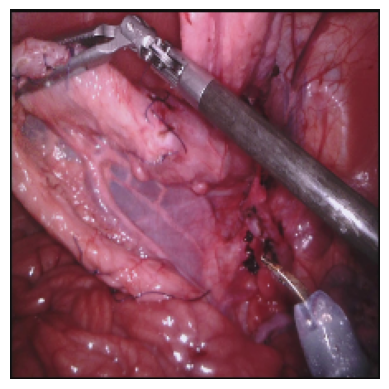

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
True: [1. 1. 0. 0. 1. 0. 0.], Predicted: [1 0 0 0 0 0 0]


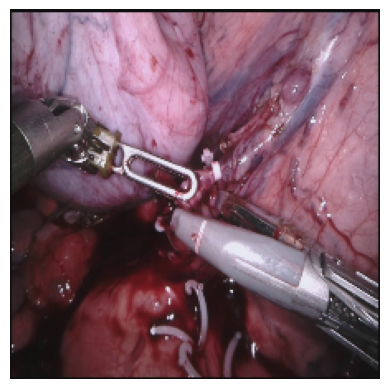

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
True: [1. 0. 1. 1. 0. 0. 0.], Predicted: [1 0 1 1 0 0 0]


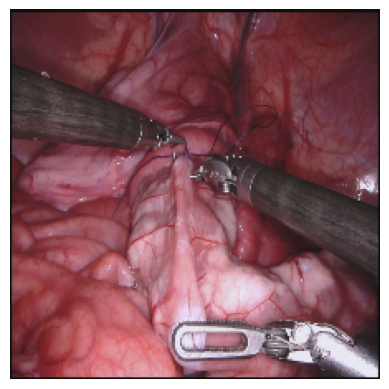

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
True: [1. 0. 1. 0. 0. 0. 0.], Predicted: [1 0 1 0 0 0 0]


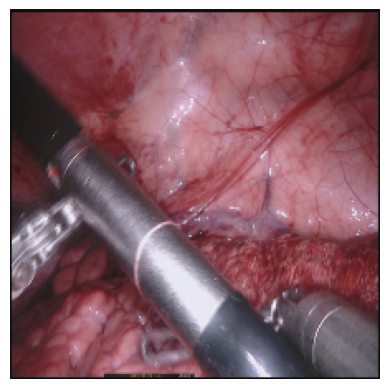

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
True: [1. 0. 1. 1. 0. 0. 0.], Predicted: [1 0 1 1 0 0 0]


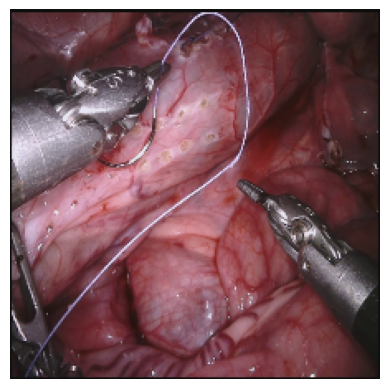

In [ ]:
for i in range(5):
    img = X_val[i]
    true_labels = Y_val[i]
    pred = model.predict(img[np.newaxis, ...])[0]
    pred_labels = (pred > 0.5).astype(int)

    print(f"True: {true_labels}, Predicted: {pred_labels}")
    plt.imshow(img)
    plt.axis('off')
    plt.show()

Fixes For Class Imbalance

In [ ]:
import tensorflow as tf

# Compute class weights inversely proportional to frequency
tool_counts = np.array([1440, 529, 593, 537, 312, 182, 286])
class_weights = 1 / (tool_counts + 1e-6)
class_weights = class_weights / class_weights.sum() * len(tool_counts)
print("Class weights:", class_weights)

# Custom weighted loss
def weighted_bce(y_true, y_pred):
    weights = tf.constant(class_weights, dtype=tf.float32)
    bce = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    return tf.reduce_mean(bce * weights)

Class weights: [0.26520727 0.72192528 0.64401092 0.71117034 1.22403357 2.09834326
 1.33530935]


In [ ]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.1),
    tf.keras.layers.RandomBrightness(0.1)
])

In [ ]:
preds = (model.predict(X_test) > 0.3).astype(int)  # instead of 0.5

6/6 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step


In [ ]:
import tensorflow as tf

def focal_loss(y_true, y_pred, gamma=2., alpha=0.25):
    # Clip predictions to avoid log(0) error
    y_pred = tf.clip_by_value(y_pred, 1e-7, 1 - 1e-7)

    # Compute cross-entropy
    cross_entropy = -y_true * tf.math.log(y_pred) - (1 - y_true) * tf.math.log(1 - y_pred)

    # Compute weight
    weight = alpha * tf.pow(1 - y_pred, gamma) * y_true + (1 - alpha) * tf.pow(y_pred, gamma) * (1 - y_true)

    # Apply weight to cross-entropy
    loss = weight * cross_entropy

    return tf.reduce_mean(loss)


model.compile(optimizer='adam', loss=focal_loss, metrics=['AUC', 'Precision', 'Recall'])

In [ ]:
BATCH_SIZE = 16

train_ds = tf.data.Dataset.from_tensor_slices((X_train, Y_train))
train_ds = train_ds.shuffle(500).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

val_ds = tf.data.Dataset.from_tensor_slices((X_val, Y_val))
val_ds = val_ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

In [ ]:
from tensorflow.keras import layers, models
from tensorflow.keras.applications import MobileNetV2

def build_model(input_shape=(224, 224, 3), num_classes=7):
    inputs = layers.Input(shape=input_shape)

    # Backbone
    base_model = MobileNetV2(include_top=False, weights='imagenet', input_tensor=inputs)
    x = base_model.output  # (7, 7, 1280)

    # Flatten for transformer
    B, H, W, C = x.shape[0], x.shape[1], x.shape[2], x.shape[3]
    x = layers.Reshape((H*W, C))(x)

    # Multi-Head Self-Attention
    attn_output = layers.MultiHeadAttention(num_heads=4, key_dim=C//4)(x, x)
    x = layers.Add()([x, attn_output])
    x = layers.LayerNormalization()(x)

    # Global pooling
    x = layers.GlobalAveragePooling1D()(x)

    # Dense head for multi-label
    outputs = layers.Dense(num_classes, activation='sigmoid')(x)

    model = models.Model(inputs, outputs)
    return model

model = build_model()

/tmp/ipython-input-3920883806.py:8: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(include_top=False, weights='imagenet', input_tensor=inputs)


In [ ]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss=focal_loss,
    metrics=[tf.keras.metrics.AUC(name='auc'),
             tf.keras.metrics.Precision(name='precision'),
             tf.keras.metrics.Recall(name='recall')]
)

In [ ]:
EPOCHS = 4

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS
)

Epoch 1/4
90/90 ━━━━━━━━━━━━━━━━━━━━ 460s 5s/step - auc: 0.9064 - loss: 0.0379 - precision: 0.8883 - recall: 0.6920 - val_auc: 0.9190 - val_loss: 0.0445 - val_precision: 0.8403 - val_recall: 0.6315
Epoch 2/4
90/90 ━━━━━━━━━━━━━━━━━━━━ 436s 5s/step - auc: 0.9990 - loss: 0.0049 - precision: 0.9940 - recall: 0.9582 - val_auc: 0.9659 - val_loss: 0.0335 - val_precision: 0.9879 - val_recall: 0.6806
Epoch 3/4
90/90 ━━━━━━━━━━━━━━━━━━━━ 419s 5s/step - auc: 0.9993 - loss: 0.0036 - precision: 0.9965 - recall: 0.9639 - val_auc: 0.9399 - val_loss: 0.0412 - val_precision: 0.9136 - val_recall: 0.7944
Epoch 4/4
90/90 ━━━━━━━━━━━━━━━━━━━━ 431s 5s/step - auc: 0.9999 - loss: 0.0016 - precision: 0.9972 - recall: 0.9890 - val_auc: 0.9747 - val_loss: 0.0233 - val_precision: 0.9728 - val_recall: 0.8205


In [ ]:
from sklearn.model_selection import train_test_split

# Assuming X and Y are the full dataset arrays
X_temp, X_test, Y_temp, Y_test = train_test_split(
    X, Y, test_size=0.1, random_state=42
)

print("Test :", X_test.shape, Y_test.shape)


BATCH_SIZE = 16

test_ds = tf.data.Dataset.from_tensor_slices((X_test, Y_test))
test_ds = test_ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

results = model.evaluate(test_ds)
print("Test results:", results)

preds = model.predict(test_ds)
# Apply threshold (default 0.5)
pred_labels = (preds > 0.5).astype(int)

for i in range(5):  # inspect first 5 samples
    print("True :", Y_test[i])
    print("Pred :", pred_labels[i])

from sklearn.metrics import precision_score, recall_score, f1_score

precision = precision_score(Y_test, pred_labels, average=None)
recall    = recall_score(Y_test, pred_labels, average=None)
f1        = f1_score(Y_test, pred_labels, average=None)

for idx in range(NUM_CLASSES):
    print(f"Tool {idx}: Precision={precision[idx]:.3f}, Recall={recall[idx]:.3f}, F1={f1[idx]:.3f}")

Test : (180, 224, 224, 3) (180, 7)
12/12 ━━━━━━━━━━━━━━━━━━━━ 10s 868ms/step - auc: 0.9766 - loss: 0.0226 - precision: 0.9788 - recall: 0.8290
Test results: [0.020069120451807976, 0.9807184934616089, 0.9783132672309875, 0.8423236608505249]
12/12 ━━━━━━━━━━━━━━━━━━━━ 13s 984ms/step
True : [1. 0. 0. 0. 0. 1. 1.]
Pred : [1 0 0 0 0 0 1]
True : [1. 1. 0. 0. 1. 0. 0.]
Pred : [1 1 0 0 1 0 0]
True : [1. 0. 1. 1. 0. 0. 0.]
Pred : [1 0 1 1 0 0 0]
True : [1. 0. 1. 0. 0. 0. 0.]
Pred : [1 0 1 0 0 0 0]
True : [1. 0. 1. 1. 0. 0. 0.]
Pred : [1 0 1 1 0 0 0]
Tool 0: Precision=1.000, Recall=1.000, F1=1.000
Tool 1: Precision=0.977, Recall=0.700, F1=0.816
Tool 2: Precision=0.985, Recall=0.867, F1=0.922
Tool 3: Precision=0.920, Recall=0.988, F1=0.952
Tool 4: Precision=1.000, Recall=0.238, F1=0.385
Tool 5: Precision=1.000, Recall=0.080, F1=0.148
Tool 6: Precision=1.000, Recall=0.800, F1=0.889


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
True: [1. 1. 1. 0. 0. 0. 0.], Predicted: [1 0 1 0 0 0 0]


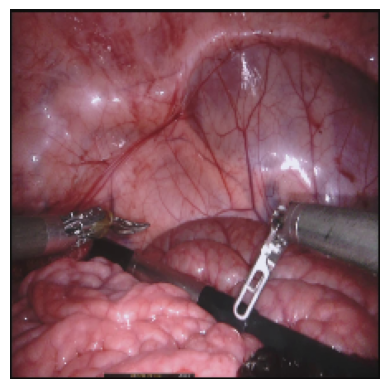

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
True: [1. 0. 1. 0. 0. 0. 0.], Predicted: [1 0 1 0 0 0 0]


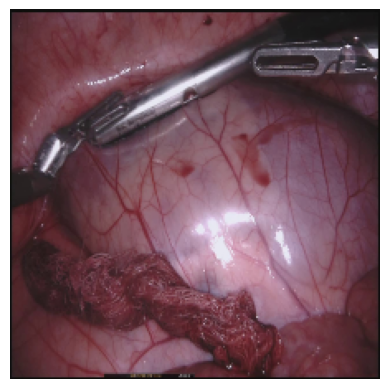

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
True: [1. 0. 1. 0. 0. 0. 0.], Predicted: [1 0 1 1 0 0 0]


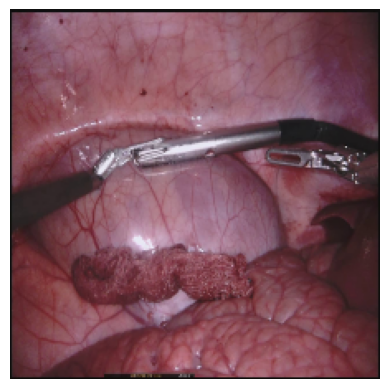

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
True: [1. 1. 0. 0. 0. 1. 1.], Predicted: [1 1 0 0 0 0 1]


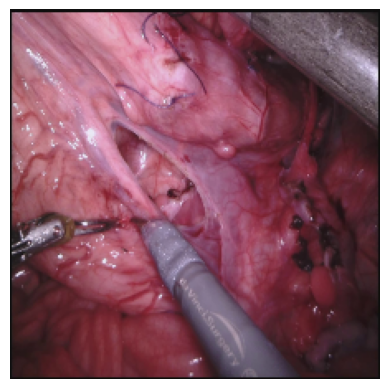

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
True: [1. 0. 0. 0. 1. 1. 0.], Predicted: [1 0 0 0 0 0 0]


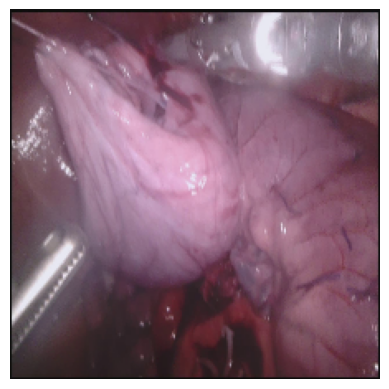

In [ ]:
for i in range(5,10):
    img = X_val[i]
    true_labels = Y_val[i]
    pred = model.predict(img[np.newaxis, ...])[0]
    pred_labels = (pred > 0.5).astype(int)

    print(f"True: {true_labels}, Predicted: {pred_labels}")
    plt.imshow(img)
    plt.axis('off')
    plt.show()

Undersampling and Testing

In [ ]:
import json
from collections import Counter

# 1️⃣ Load the JSON annotations
with open("/content/endovis2017/endovis2017/instrument_type_mapping.json", "r") as f:
    data = json.load(f)

data

{'Bipolar Forceps': 1,
 'Prograsp Forceps': 2,
 'Large Needle Driver': 3,
 'Vessel Sealer': 4,
 'Grasping Retractor': 5,
 'Monopolar Curved Scissors': 6,
 'Other': 7}

In [ ]:
import numpy as np
from collections import Counter

# Mapping from tool name to ID
tool_map = {
    'Bipolar Forceps': 1,
    'Prograsp Forceps': 2,
    'Large Needle Driver': 3,
    'Vessel Sealer': 4,
    'Grasping Retractor': 5,
    'Monopolar Curved Scissors': 6,
    'Other': 7
}

# Suppose mask_paths is a list of all mask files
tool_counts = Counter()

for mask_path in mask_paths:
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    unique_tools = np.unique(mask)
    # Only count tools that exist in tool_map
    for t in unique_tools:
        if t in tool_map.values():
            tool_name = [name for name, idx in tool_map.items() if idx == t][0]
            tool_counts[tool_name] += 1

# Print results
for tool, count in tool_counts.items():
    print(f"{tool}: {count}")

Bipolar Forceps: 656
Prograsp Forceps: 745
Other: 449
Large Needle Driver: 672
Vessel Sealer: 385
Grasping Retractor: 228
Monopolar Curved Scissors: 351


In [ ]:
#Compute class weights from counts
import numpy as np

# Tool counts and names
tool_counts = np.array([656, 745, 449, 672, 385, 228, 351])
tool_names  = ['Bipolar Forceps', 'Prograsp Forceps', 'Other',
               'Large Needle Driver', 'Vessel Sealer',
               'Grasping Retractor', 'Monopolar Curved Scissors']

# Inverse frequency for weighting
class_weights = tool_counts.max() / tool_counts
class_weights_dict = {i: w for i, w in enumerate(class_weights)}

print("Class weights:")
for i, name in enumerate(tool_names):
    print(f"{name}: {class_weights[i]:.2f}")

Class weights:
Bipolar Forceps: 1.14
Prograsp Forceps: 1.00
Other: 1.66
Large Needle Driver: 1.11
Vessel Sealer: 1.94
Grasping Retractor: 3.27
Monopolar Curved Scissors: 2.12


In [ ]:
# Resampling
# Compute sum of tools per image
tool_sums = Y_train.sum(axis=1)

# Keep images where at least one rare tool exists or total tool count > 1
rare_threshold = 300  # example, tools with count < rare_threshold are rare
rare_tool_idx = np.where(tool_counts < rare_threshold)[0]

def is_rare(row):
    return any(row[idx]==1 for idx in rare_tool_idx)

# Filter X_train and Y_train
mask = np.array([is_rare(row) or row.sum()>1 for row in Y_train])
X_train_resampled = X_train[mask]
Y_train_resampled = Y_train[mask]

print("Resampled training set:", X_train_resampled.shape, Y_train_resampled.shape)

Resampled training set: (1423, 224, 224, 3) (1423, 7)


In [ ]:
# Focal Loss

import tensorflow as tf

def sigmoid_focal_loss(y_true, y_pred, alpha=0.25, gamma=2.0):
    """
    y_true: ground truth labels, shape (batch, num_classes)
    y_pred: predicted probabilities, shape (batch, num_classes)
    """
    y_pred = tf.clip_by_value(y_pred, 1e-7, 1-1e-7)

    # Compute cross-entropy
    ce = - (y_true * tf.math.log(y_pred) + (1 - y_true) * tf.math.log(1 - y_pred))

    # Compute focal factor
    p_t = y_true * y_pred + (1 - y_true) * (1 - y_pred)
    focal_factor = alpha * tf.pow(1 - p_t, gamma)

    loss = focal_factor * ce
    return tf.reduce_mean(tf.reduce_sum(loss, axis=1))

In [ ]:
model = build_model()
model.summary()

/tmp/ipython-input-3920883806.py:8: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(include_top=False, weights='imagenet', input_tensor=inputs)


Model: "functional_24"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_37      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer_37[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 8,828,231 (33.68 MB)

 Trainable params: 8,794,119 (33.55 MB)

 Non-trainable params: 34,112 (133.25 KB)

In [ ]:
import tensorflow as tf

BATCH_SIZE = 16

train_ds = tf.data.Dataset.from_tensor_slices((X_train_resampled, Y_train_resampled))
train_ds = train_ds.shuffle(500).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

val_ds = tf.data.Dataset.from_tensor_slices((X_val, Y_val))
val_ds = val_ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

In [ ]:
model.compile(
    optimizer=tf.optimizers.Adam(1e-3),
    loss=sigmoid_focal_loss,
    metrics=['AUC', 'Precision', 'Recall']
)

In [ ]:
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=4,
    class_weight=class_weights_dict
)

Epoch 1/4
89/89 ━━━━━━━━━━━━━━━━━━━━ 458s 5s/step - AUC: 0.9182 - Precision: 0.8244 - Recall: 0.8596 - loss: 0.4449 - val_AUC: 0.8549 - val_Precision: 1.0000 - val_Recall: 0.3779 - val_loss: 1.5870
Epoch 2/4
89/89 ━━━━━━━━━━━━━━━━━━━━ 415s 5s/step - AUC: 0.9946 - Precision: 0.9630 - Recall: 0.9648 - loss: 0.0564 - val_AUC: 0.7602 - val_Precision: 0.6124 - val_Recall: 0.5772 - val_loss: 1.4547
Epoch 3/4
89/89 ━━━━━━━━━━━━━━━━━━━━ 438s 5s/step - AUC: 0.9992 - Precision: 0.9855 - Recall: 0.9896 - loss: 0.0181 - val_AUC: 0.7371 - val_Precision: 0.6772 - val_Recall: 0.5125 - val_loss: 1.5549
Epoch 4/4
89/89 ━━━━━━━━━━━━━━━━━━━━ 446s 5s/step - AUC: 0.9996 - Precision: 0.9889 - Recall: 0.9911 - loss: 0.0122 - val_AUC: 0.8736 - val_Precision: 0.7805 - val_Recall: 0.6534 - val_loss: 0.4134


In [ ]:
from sklearn.model_selection import train_test_split

# Assuming X and Y are the full dataset arrays
X_temp, X_test, Y_temp, Y_test = train_test_split(
    X, Y, test_size=0.1, random_state=42
)

print("Test :", X_test.shape, Y_test.shape)


BATCH_SIZE = 16

test_ds = tf.data.Dataset.from_tensor_slices((X_test, Y_test))
test_ds = test_ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

results = model.evaluate(test_ds)
print("Test results:", results)

preds = model.predict(test_ds)
# Apply threshold (default 0.5)
pred_labels = (preds > 0.5).astype(int)

for i in range(5):  # inspect first 5 samples
    print("True :", Y_test[i])
    print("Pred :", pred_labels[i])

from sklearn.metrics import precision_score, recall_score, f1_score

precision = precision_score(Y_test, pred_labels, average=None)
recall    = recall_score(Y_test, pred_labels, average=None)
f1        = f1_score(Y_test, pred_labels, average=None)

for idx in range(NUM_CLASSES):
    print(f"Tool {idx}: Precision={precision[idx]:.3f}, Recall={recall[idx]:.3f}, F1={f1[idx]:.3f}")

Test : (180, 224, 224, 3) (180, 7)
12/12 ━━━━━━━━━━━━━━━━━━━━ 11s 868ms/step - AUC: 0.8757 - Precision: 0.8071 - Recall: 0.6636 - loss: 0.4345
Test results: [0.42456674575805664, 0.8786226511001587, 0.8095238208770752, 0.6701244711875916]
12/12 ━━━━━━━━━━━━━━━━━━━━ 13s 997ms/step
True : [1. 0. 0. 0. 0. 1. 1.]
Pred : [1 0 0 0 0 1 0]
True : [1. 1. 0. 0. 1. 0. 0.]
Pred : [1 1 0 0 1 0 0]
True : [1. 0. 1. 1. 0. 0. 0.]
Pred : [1 0 1 1 0 0 0]
True : [1. 0. 1. 0. 0. 0. 0.]
Pred : [1 0 0 0 0 0 0]
True : [1. 0. 1. 1. 0. 0. 0.]
Pred : [1 0 0 1 0 0 0]
Tool 0: Precision=1.000, Recall=1.000, F1=1.000
Tool 1: Precision=1.000, Recall=0.217, F1=0.356
Tool 2: Precision=1.000, Recall=0.293, F1=0.454
Tool 3: Precision=0.814, Recall=0.975, F1=0.888
Tool 4: Precision=1.000, Recall=0.476, F1=0.645
Tool 5: Precision=0.237, Recall=0.720, F1=0.356
Tool 6: Precision=1.000, Recall=0.025, F1=0.049


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
True: [1. 1. 0. 0. 0. 1. 1.], Predicted: [1 0 0 0 0 0 0]


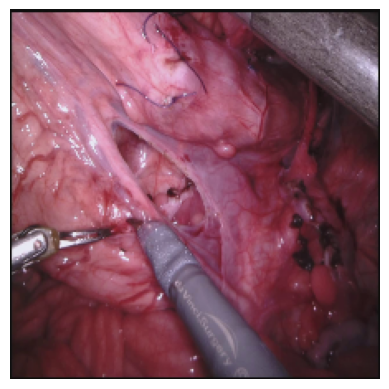

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
True: [1. 1. 0. 0. 1. 0. 0.], Predicted: [1 1 0 0 1 0 0]


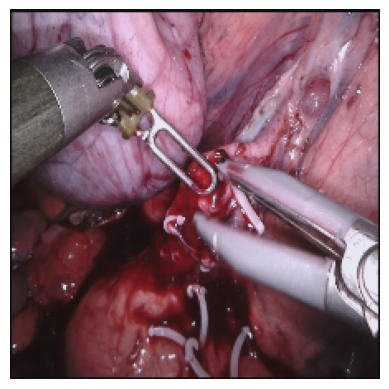

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
True: [1. 0. 1. 1. 0. 0. 1.], Predicted: [1 0 0 1 0 0 0]


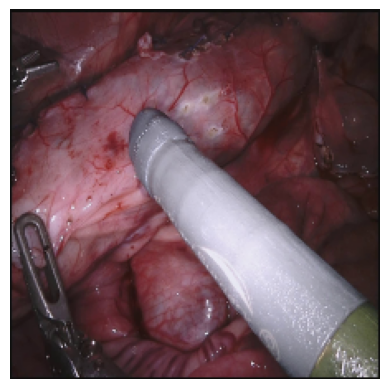

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
True: [1. 1. 0. 0. 0. 0. 0.], Predicted: [1 0 0 0 0 0 0]


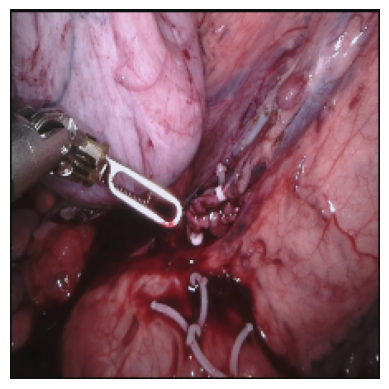

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
True: [1. 0. 0. 1. 0. 0. 0.], Predicted: [1 0 0 1 0 0 0]


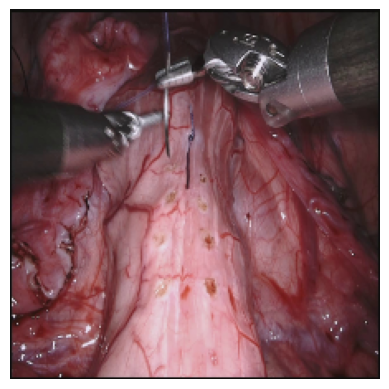

In [ ]:
for i in range(10,15):
    img = X_val[i]
    true_labels = Y_val[i]
    pred = model.predict(img[np.newaxis, ...])[0]
    pred_labels = (pred > 0.5).astype(int)

    print(f"True: {true_labels}, Predicted: {pred_labels}")
    plt.imshow(img)
    plt.axis('off')
    plt.show()

Oversampling + Assymetric Loss

In [ ]:
import tensorflow as tf

def augment_image(img):
    # Ensure dtype is float32 [0,1]
    img = tf.image.convert_image_dtype(img, tf.float32)

    # Random horizontal & vertical flip
    img = tf.image.random_flip_left_right(img)
    img = tf.image.random_flip_up_down(img)

    # Random rotation using tf.image.rot90
    k = tf.random.uniform([], minval=0, maxval=4, dtype=tf.int32)  # 0,1,2,3
    img = tf.image.rot90(img, k)

    # Random crop & resize back
    crop_frac = tf.random.uniform([], 0.7, 1.0)  # keep 70–100% of image
    new_size = tf.cast(crop_frac * tf.cast(tf.shape(img)[:2], tf.float32), tf.int32)
    img = tf.image.random_crop(img, size=[new_size[0], new_size[1], 3])
    img = tf.image.resize(img, [224, 224])

    # Random brightness
    img = tf.image.random_brightness(img, max_delta=0.2)

    # Random contrast
    img = tf.image.random_contrast(img, lower=0.8, upper=1.2)

    # Random saturation
    img = tf.image.random_saturation(img, lower=0.8, upper=1.2)

    return img

In [ ]:
def load_image(idx, training=True):
    img = X[idx]          # if X is in memory (numpy array)
    label = Y[idx]

    img = tf.convert_to_tensor(img, dtype=tf.float32) / 255.0

    if training:
        img = augment_image(img)   # apply augmentation

    return img, label

In [ ]:
BATCH_SIZE = 16

train_ds = tf.data.Dataset.from_tensor_slices(balanced_indices)
train_ds = train_ds.shuffle(1000).map(
    lambda i: (augment_image(tf.gather(X, i)), tf.gather(Y, i)),
    num_parallel_calls=tf.data.AUTOTUNE
).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

# Validation dataset (use original X and Y split)
from sklearn.model_selection import train_test_split

train_idx, val_idx = train_test_split(np.arange(len(X)), test_size=0.2, random_state=42)
val_ds = tf.data.Dataset.from_tensor_slices(val_idx).map(
    lambda i: (X[i], Y[i]),
    num_parallel_calls=tf.data.AUTOTUNE
).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

In [ ]:
BATCH_SIZE = 16

train_ds = tf.data.Dataset.from_tensor_slices(balanced_indices)
train_ds = train_ds.shuffle(1000).map(
    lambda i: (augment_image(tf.gather(X, i)), tf.gather(Y, i)),
    num_parallel_calls=tf.data.AUTOTUNE
).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

# Validation dataset (use original X and Y split)
from sklearn.model_selection import train_test_split

train_idx, val_idx = train_test_split(np.arange(len(X)), test_size=0.2, random_state=42)
val_ds = tf.data.Dataset.from_tensor_slices(val_idx).map(
    lambda i: (X[i], Y[i]),
    num_parallel_calls=tf.data.AUTOTUNE
).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

Image Augmentation for oversamppling will not be very efficient here because it is a multiclass classification and when you increase the minority class count the majority class count will also increase, so we should work with class based weights and loss penalisation for not identifying the minority classes.

In [ ]:
import os
import cv2
import numpy as np
from glob import glob

# Configuration
IMAGE_DIR = "/content/endovis2017/endovis2017/train/image"
MASK_DIR  = "/content/endovis2017/endovis2017/train/label"
IMG_SIZE = 224
NUM_CLASSES = 7

# Tool mapping (1-based in masks)
tool_map = {
    1: 'Bipolar Forceps',
    2: 'Prograsp Forceps',
    3: 'Large Needle Driver',
    4: 'Vessel Sealer',
    5: 'Grasping Retractor',
    6: 'Monopolar Curved Scissors',
    7: 'Other'
}

# Sort paths to align images and masks
image_paths = sorted(glob(os.path.join(IMAGE_DIR, "*.bmp")))
mask_paths  = sorted(glob(os.path.join(MASK_DIR, "*.bmp")))

print(f"Found {len(image_paths)} images and {len(mask_paths)} masks")

Found 1800 images and 1800 masks


In [ ]:
import os
import cv2
import numpy as np
from glob import glob

# ---------- CONFIG ----------
NUM_CLASSES = 7
IMAGE_DIR = "/content/endovis2017/endovis2017/train/image"
MASK_DIR  = "/content/endovis2017/endovis2017/train/label"
IMG_SIZE = 224

# ---------- File paths ----------
image_paths = sorted(glob(os.path.join(IMAGE_DIR, "*.bmp")))
mask_paths  = sorted(glob(os.path.join(MASK_DIR, "*.bmp")))

# ---------- Map mask to multi-hot vector ----------
def mask_to_vector(mask_path):
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    unique = np.unique(mask)
    vec = np.zeros(NUM_CLASSES, dtype=np.float32)
    for u in unique:
        if 1 <= u <= NUM_CLASSES:   # Note: mask IDs start from 1 to 7
            vec[u-1] = 1.0          # Convert to 0-based index
    return vec

Y = np.array([mask_to_vector(p) for p in mask_paths], dtype=np.float32)

# ---------- Preprocess images ----------
def preprocess_image(path):
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
    img = img / 255.0
    return img.astype(np.float32)

X = np.array([preprocess_image(p) for p in image_paths], dtype=np.float32)

print("X shape:", X.shape)
print("Y shape:", Y.shape)

X shape: (1800, 224, 224, 3)
Y shape: (1800, 7)


In [ ]:
tool_names = [
    "Bipolar Forceps",
    "Prograsp Forceps",
    "Large Needle Driver",
    "Vessel Sealer",
    "Grasping Retractor",
    "Monopolar Curved Scissors",
    "Other"
]

orig_counts = Y.sum(axis=0).astype(int)
print("Original tool counts (ID, Name, Count):")
for i, c in enumerate(orig_counts):
    print(f"{i+1:02d} {tool_names[i]:30s} : {c}")

Original tool counts (ID, Name, Count):
01 Bipolar Forceps                : 656
02 Prograsp Forceps               : 745
03 Large Needle Driver            : 672
04 Vessel Sealer                  : 385
05 Grasping Retractor             : 228
06 Monopolar Curved Scissors      : 351
07 Other                          : 449


In [ ]:
from sklearn.utils import class_weight

# Class weights for multi-label: compute per column
class_weights = {}
for i in range(NUM_CLASSES):
    weights = class_weight.compute_class_weight(
        class_weight='balanced',
        classes=np.array([0,1]),
        y=Y[:, i]
    )
    class_weights[i] = weights[1]  # weight for positive class
print("Class Weights:", class_weights)

Class Weights: {0: np.float64(1.3719512195121952), 1: np.float64(1.2080536912751678), 2: np.float64(1.3392857142857142), 3: np.float64(2.3376623376623376), 4: np.float64(3.9473684210526314), 5: np.float64(2.5641025641025643), 6: np.float64(2.0044543429844097)}


In [ ]:
import tensorflow as tf

# Target per-class count = maximum count of minority classes
target_count = int(np.max(orig_counts))  # or set fixed e.g., 500
print("Target count per class:", target_count)

# Collect indices per class
indices_per_class = [np.where(Y[:, i]==1)[0] for i in range(NUM_CLASSES)]

# Oversample minority classes with augmentation
balanced_indices = []

for i, idx in enumerate(indices_per_class):
    n_have = len(idx)
    if n_have >= target_count:
        # Randomly sample without replacement if exceeding target
        sampled = np.random.choice(idx, size=target_count, replace=False)
    else:
        # Oversample minority class
        n_repeat = target_count - n_have
        sampled = np.concatenate([
            idx,
            np.random.choice(idx, size=n_repeat, replace=True)
        ])
    balanced_indices.extend(sampled)

balanced_indices = np.array(balanced_indices)
np.random.shuffle(balanced_indices)

print("Total samples after balancing:", len(balanced_indices))

Target count per class: 745
Total samples after balancing: 5215


In [ ]:
def augment_image(img):
    img = tf.image.random_flip_left_right(img)
    img = tf.image.random_flip_up_down(img)
    img = tf.image.random_brightness(img, max_delta=0.2)
    img = tf.image.random_contrast(img, lower=0.8, upper=1.2)
    img = tf.image.random_crop(img, size=[IMG_SIZE, IMG_SIZE, 3])
    return img

In [ ]:
import tensorflow as tf

BATCH_SIZE = 16
IMG_SIZE = 224

# --- Function to load and preprocess a single image ---
def load_and_preprocess(idx):
    path = image_paths[idx.numpy()]       # load from disk
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
    img = img / 255.0
    label = Y[idx.numpy()]                # corresponding multi-hot vector
    return img.astype(np.float32), label.astype(np.float32)

# --- Wrap with tf.py_function for TF graph ---
def tf_load_and_preprocess(idx):
    img, label = tf.py_function(load_and_preprocess, [idx], [tf.float32, tf.float32])
    img.set_shape([IMG_SIZE, IMG_SIZE, 3])
    label.set_shape([NUM_CLASSES])
    return img, label

# --- Data augmentation function ---
def augment(img, label):
    img = tf.image.random_flip_left_right(img)
    img = tf.image.random_flip_up_down(img)
    img = tf.image.random_brightness(img, 0.2)
    img = tf.image.random_contrast(img, 0.8, 1.2)
    return img, label

# --- Build Dataset from balanced indices ---
balanced_indices_tensor = tf.constant(balanced_indices, dtype=tf.int32)
train_ds = tf.data.Dataset.from_tensor_slices(balanced_indices_tensor)
train_ds = train_ds.shuffle(1000)
train_ds = train_ds.map(tf_load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
train_ds = train_ds.map(augment, num_parallel_calls=tf.data.AUTOTUNE)
train_ds = train_ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

# --- Validation Dataset ---
val_idx_tensor = tf.constant(np.arange(len(X)), dtype=tf.int32)
val_ds = tf.data.Dataset.from_tensor_slices(val_idx_tensor)
val_ds = val_ds.map(tf_load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
val_ds = val_ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

Model Building and Training

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.applications import MobileNetV3Small
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import numpy as np

def se_block(input_tensor, reduction=16):
    channels = input_tensor.shape[-1]
    se = layers.GlobalAveragePooling2D()(input_tensor)
    se = layers.Dense(channels // reduction, activation='relu')(se)
    se = layers.Dense(channels, activation='sigmoid')(se)
    se = layers.Reshape((1,1,channels))(se)
    return layers.Multiply()([input_tensor, se])

def build_model(input_shape=(IMG_SIZE, IMG_SIZE, 3), num_classes=NUM_CLASSES):
    base_model = MobileNetV3Small(input_shape=input_shape, include_top=False, weights='imagenet')
    base_model.trainable = True  # fine-tune

    inputs = layers.Input(shape=input_shape)
    x = base_model(inputs, training=True)
    x = se_block(x)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.3)(x)
    outputs = layers.Dense(num_classes, activation='sigmoid')(x)  # multi-label
    model = models.Model(inputs, outputs)
    return model

model = build_model()
model.summary()

4334752/4334752 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ MobileNetV3Small    │ (None, 7, 7, 576) │    939,120 │ input_layer_1[0]… │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 576)       │          0 │ MobileNetV3Small… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 36)        │     20,772 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 576)       │     21,312 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape (Reshape)   │ (None, 1, 1, 576) │          0 │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multiply_9          │ (None, 7, 7, 576) │          0 │ MobileNetV3Small… │
│ (Multiply)          │                   │            │ reshape[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 576)       │          0 │ multiply_9[0][0]  │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 576)       │          0 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 7)         │      4,039 │ dropout[0][0]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 985,243 (3.76 MB)

 Trainable params: 973,131 (3.71 MB)

 Non-trainable params: 12,112 (47.31 KB)

In [ ]:
def binary_focal_loss(gamma=2.0, alpha=0.25):
    def loss(y_true, y_pred):
        y_true = tf.cast(y_true, tf.float32)
        bce = tf.keras.losses.binary_crossentropy(y_true, y_pred)
        p_t = y_true * y_pred + (1 - y_true) * (1 - y_pred)
        alpha_factor = y_true * alpha + (1 - y_true) * (1 - alpha)
        modulating_factor = tf.pow(1.0 - p_t, gamma)
        return tf.reduce_mean(alpha_factor * modulating_factor * bce)
    return loss

# Assuming multi-label Y with shape [batch_size, 7]

# Use binary focal crossentropy for multi-label + imbalance
loss_fn = tf.keras.losses.BinaryFocalCrossentropy(
    from_logits=False,   # True if your model outputs logits, False if using sigmoid
    gamma=2.0,
    alpha=0.25
)

model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss=loss_fn,
    metrics=[
        tf.keras.metrics.AUC(name="auc"),
        tf.keras.metrics.Precision(name="precision"),
        tf.keras.metrics.Recall(name="recall")
    ]
)


In [ ]:
callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)
]

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=4,
    callbacks=callbacks
)

Epoch 1/4
326/326 ━━━━━━━━━━━━━━━━━━━━ 350s 953ms/step - auc: 0.6995 - loss: 0.1649 - precision: 0.5046 - recall: 0.5585 - val_auc: 0.4784 - val_loss: 0.1931 - val_precision: 0.2681 - val_recall: 0.5536 - learning_rate: 1.0000e-04
Epoch 2/4
326/326 ━━━━━━━━━━━━━━━━━━━━ 319s 979ms/step - auc: 0.9803 - loss: 0.0476 - precision: 0.9068 - recall: 0.8854 - val_auc: 0.5161 - val_loss: 0.1787 - val_precision: 0.2611 - val_recall: 0.4977 - learning_rate: 1.0000e-04
Epoch 3/4
326/326 ━━━━━━━━━━━━━━━━━━━━ 296s 907ms/step - auc: 0.9941 - loss: 0.0246 - precision: 0.9499 - recall: 0.9577 - val_auc: 0.5485 - val_loss: 0.1702 - val_precision: 0.2265 - val_recall: 0.1196 - learning_rate: 1.0000e-04
Epoch 4/4
326/326 ━━━━━━━━━━━━━━━━━━━━ 310s 953ms/step - auc: 0.9973 - loss: 0.0161 - precision: 0.9669 - recall: 0.9722 - val_auc: 0.5496 - val_loss: 0.1666 - val_precision: 0.2283 - val_recall: 0.1208 - learning_rate: 1.0000e-04


Model Overfitted so let us use different model

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models

def LCAM_block(x, patch_size=4):
    """Local Context Attention Mixer (Keras-compatible)."""
    # 1x1 convolution to compute attention map
    attn = layers.Conv2D(x.shape[-1], kernel_size=1, activation='sigmoid')(x)
    # Multiply input by attention map
    return layers.Multiply()([x, attn])

def build_LCAM_model(input_shape=(224,224,3), num_classes=7):
    inputs = layers.Input(shape=input_shape)

    # EfficientNetB0 backbone (pretrained optional)
    base_model = tf.keras.applications.EfficientNetB0(
        include_top=False, input_tensor=inputs, weights=None, pooling=None
    )
    x = base_model.output  # shape: (None, 7, 7, 1280)

    # Apply 2 LCAM blocks
    x = LCAM_block(x)
    x = LCAM_block(x)

    # Global pooling + classifier
    x = layers.GlobalAveragePooling2D()(x)
    outputs = layers.Dense(num_classes, activation='sigmoid')(x)

    model = models.Model(inputs, outputs)
    return model

# Build model
model = build_LCAM_model()
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 224, 224,  │          0 │ input_layer[0][0] │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 224, 224,  │          7 │ rescaling[0][0]   │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 225, 225,  │          0 │ normalization[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        864 │ stem_conv_pad[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 112, 112,  │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 112, 112,  │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 112, 112,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 32)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 32)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 8)   │        264 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 32)  │        288 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 112, 112,  │          0 │ block1a_activati… │
│ (Multiply)          │ 32)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │        512 │ block1a_se_excit… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, 112, 112,  │         64 │ block1a_project_

 Total params: 7,337,898 (27.99 MB)

 Trainable params: 7,295,875 (27.83 MB)

 Non-trainable params: 42,023 (164.16 KB)

In [ ]:
# Compile with class-weighted focal loss
def sigmoid_focal_loss(gamma=2., alpha=0.25):
    def loss(y_true, y_pred):
        y_pred = tf.clip_by_value(y_pred, 1e-7, 1-1e-7)
        ce = -(y_true*tf.math.log(y_pred) + (1-y_true)*tf.math.log(1-y_pred))
        p_t = y_true*y_pred + (1-y_true)*(1-y_pred)
        alpha_factor = y_true*alpha + (1-y_true)*(1-alpha)
        modulating_factor = tf.pow(1.0 - p_t, gamma)
        return tf.reduce_mean(alpha_factor * modulating_factor * ce)
    return loss

model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-4),
    loss=sigmoid_focal_loss(),
    metrics=[tf.keras.metrics.AUC(name='auc'),
             tf.keras.metrics.Precision(name='precision'),
             tf.keras.metrics.Recall(name='recall')]
)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
callbacks = [
    EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)
]

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=4,
    callbacks=callbacks
)

Epoch 1/4
326/326 ━━━━━━━━━━━━━━━━━━━━ 194s 325ms/step - auc: 0.6013 - loss: 0.0672 - precision: 0.4347 - recall: 0.0417 - val_auc: 0.5243 - val_loss: 0.0657 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 1.0000e-04
Epoch 2/4
326/326 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - auc: 0.8580 - loss: 0.0439 - precision: 0.8643 - recall: 0.3075 - val_auc: 0.7546 - val_loss: 0.0509 - val_precision: 0.7805 - val_recall: 0.0092 - learning_rate: 1.0000e-04
Epoch 3/4
326/326 ━━━━━━━━━━━━━━━━━━━━ 41s 125ms/step - auc: 0.9354 - loss: 0.0325 - precision: 0.8983 - recall: 0.5515 - val_auc: 0.9645 - val_loss: 0.0238 - val_precision: 0.9078 - val_recall: 0.7375 - learning_rate: 1.0000e-04
Epoch 4/4
326/326 ━━━━━━━━━━━━━━━━━━━━ 41s 126ms/step - auc: 0.9557 - loss: 0.0274 - precision: 0.9121 - recall: 0.6523 - val_auc: 0.9859 - val_loss: 0.0158 - val_precision: 0.9353 - val_recall: 0.8589 - learning_rate: 1.0000e-04


In [ ]:
from sklearn.model_selection import train_test_split

# Assuming X and Y are the full dataset arrays
X_temp, X_test, Y_temp, Y_test = train_test_split(
    X, Y, test_size=0.1, random_state=42
)

print("Test :", X_test.shape, Y_test.shape)


BATCH_SIZE = 16

test_ds = tf.data.Dataset.from_tensor_slices((X_test, Y_test))
test_ds = test_ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

results = model.evaluate(test_ds)
print("Test results:", results)

preds = model.predict(test_ds)
# Apply threshold (default 0.5)
pred_labels = (preds > 0.5).astype(int)

for i in range(5):  # inspect first 5 samples
    print("True :", Y_test[i])
    print("Pred :", pred_labels[i])

from sklearn.metrics import precision_score, recall_score, f1_score

precision = precision_score(Y_test, pred_labels, average=None)
recall    = recall_score(Y_test, pred_labels, average=None)
f1        = f1_score(Y_test, pred_labels, average=None)

for idx in range(NUM_CLASSES):
    print(f"Tool {idx}: Precision={precision[idx]:.3f}, Recall={recall[idx]:.3f}, F1={f1[idx]:.3f}")

Test : (180, 224, 224, 3) (180, 7)
12/12 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - auc: 0.9867 - loss: 0.0157 - precision: 0.9334 - recall: 0.8913
Test results: [0.014775780960917473, 0.9882506728172302, 0.9504643678665161, 0.8950437307357788]
12/12 ━━━━━━━━━━━━━━━━━━━━ 13s 621ms/step
True : [0. 0. 0. 0. 1. 1. 0.]
Pred : [1 0 0 0 1 1 0]
True : [1. 0. 0. 1. 0. 0. 0.]
Pred : [1 0 0 1 0 0 0]
True : [0. 1. 1. 0. 0. 0. 0.]
Pred : [0 1 1 0 0 0 0]
True : [0. 1. 0. 0. 0. 0. 1.]
Pred : [0 1 0 0 0 0 1]
True : [0. 1. 1. 0. 0. 0. 0.]
Pred : [0 1 1 0 0 0 0]
Tool 0: Precision=0.930, Recall=0.883, F1=0.906
Tool 1: Precision=0.984, Recall=0.827, F1=0.899
Tool 2: Precision=1.000, Recall=0.963, F1=0.981
Tool 3: Precision=0.708, Recall=0.810, F1=0.756
Tool 4: Precision=0.952, Recall=0.800, F1=0.870
Tool 5: Precision=0.923, Recall=0.900, F1=0.911
Tool 6: Precision=1.000, Recall=1.000, F1=1.000


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
True: [0. 1. 1. 0. 0. 0. 0.], Predicted: [0 1 1 0 0 0 0]


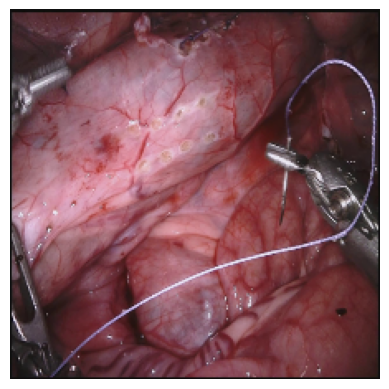

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
True: [0. 0. 1. 0. 0. 0. 0.], Predicted: [0 0 1 0 0 0 0]


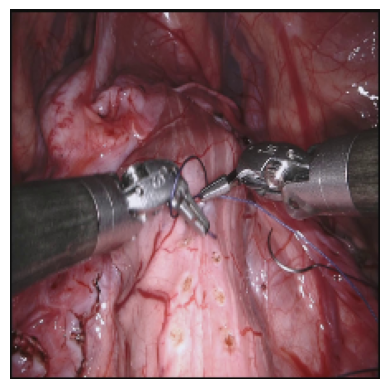

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
True: [1. 0. 0. 1. 0. 0. 0.], Predicted: [1 0 0 1 0 0 0]


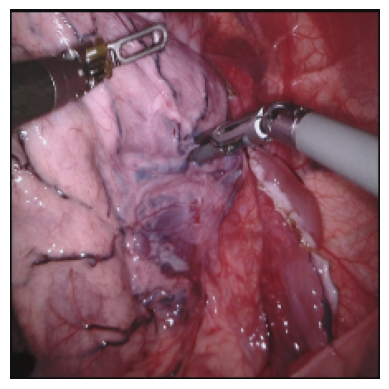

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
True: [0. 0. 1. 0. 0. 0. 0.], Predicted: [0 0 1 0 0 0 0]


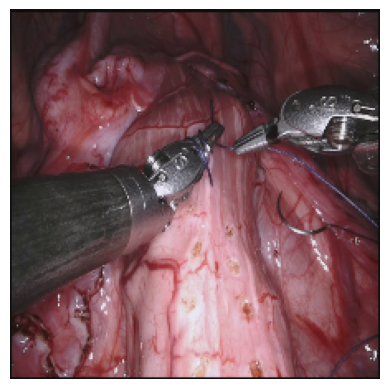

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
True: [1. 0. 0. 0. 1. 1. 0.], Predicted: [1 0 0 0 1 1 0]


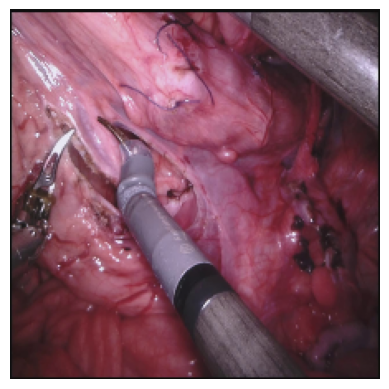

In [ ]:
import matplotlib.pyplot as plt
for i in range(15,20):
    img = X_test[i]
    true_labels = Y_test[i]
    pred = model.predict(img[np.newaxis, ...])[0]
    pred_labels = (pred > 0.5).astype(int)

    print(f"True: {true_labels}, Predicted: {pred_labels}")
    plt.imshow(img)
    plt.axis('off')
    plt.show()

In [ ]:
import numpy as np
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score

# Collect predictions
y_true, y_pred = [], []
for Xb, yb in test_ds:
    preds = model.predict(Xb)
    y_true.append(yb.numpy())
    y_pred.append(preds)

y_true = np.concatenate(y_true)
y_pred = np.concatenate(y_pred)

# Apply threshold (default 0.5, or your tuned thresholds per class)
y_pred_bin = (y_pred >= 0.5).astype(int)

# Subset accuracy (exact match of all tools in a frame)
subset_acc = accuracy_score(y_true, y_pred_bin)

# Micro (global) and Macro (average per class) metrics
micro_f1 = f1_score(y_true, y_pred_bin, average="micro")
macro_f1 = f1_score(y_true, y_pred_bin, average="macro")
micro_acc = accuracy_score(y_true.flatten(), y_pred_bin.flatten())

print(f"Subset Accuracy (Exact Match): {subset_acc:.4f}")
print(f"Micro Accuracy: {micro_acc:.4f}")
print(f"Micro F1: {micro_f1:.4f}, Macro F1: {macro_f1:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
Subset Accuracy (Exact Match): 0.7611
Micro Accuracy: 0.9587
Micro F1: 0.9219, Macro F1: 0.9032


We have :

subset accuracy → strictest measure

micro accuracy → overall correctness across all tools

F1 scores → balanced view across imbalanced classes

In [ ]:
# Recommended modern format
model.save("best_lcam_model.keras")

# OR legacy HDF5 format
model.save("best_lcam_model.h5")

# OR export for serving / TFLite
model.export("best_lcam_model")

Saved artifact at 'best_lcam_model'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor')
Output Type:
  TensorSpec(shape=(None, 7), dtype=tf.float32, name=None)
Captures:
  137172019057424: TensorSpec(shape=(1, 1, 1, 3), dtype=tf.float32, name=None)
  137172019056848: TensorSpec(shape=(1, 1, 1, 3), dtype=tf.float32, name=None)
  137172019057040: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137172019055312: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137172019058576: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137172019058192: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137172019057808: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137172019056272: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137172019059536: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137172019060112: TensorSpec(shape=(), dtype=tf.resource, name=None)

The results are good, but let us try to improve class 3's performance